In [1]:
import pandas as pd
import numpy as np
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
import category_encoders as ce

In [2]:
with open('../pickle_files/clustering2.pkl', 'rb') as f:
    players_clusters_df = pickle.load(f)
    cluster_names = pickle.load(f)

In [3]:
for name in players_clusters_df["PLAYER"]:
    if len(name.split()) > 3:
        print(name)

Luc Mbah a Moute16
Luc Mbah a Moute17
Luc Mbah a Moute18


In [4]:
confusing_name_list = ["JaMychal Green", "Jeff Green", "Jalen Green", "Josh Green",
                        "Draymond Green", "Danny Green", 
                        "Stephen Curry", "Seth Curry", 
                        "Marcus Morris", "Markieff Morris", "Monte Morris",
                        "JR Smith", "Jason Smith", "Josh Smith", "Jalen Smith",
                        "James Johnson", "Joe Johnson",
                        "Deron Williams", "Derrick Williams",
                        "Marvin Williams", "Mo Williams",
                        "Trae Young", "Thaddeus Young",
                        "Jerami Grant", "Jerian Grant",
                        "Mason Plumlee", "Miles Plumlee",
                        "Justin Anderson", "James Anderson",
                        "Jrue Holiday", "Justin Holiday",
                        "Aaron Wiggins", "Andrew Wiggins",
                        "Bojan Bogdanovic", "Bogdan Bogdanovic",
                        "Josh Jackson", "Justin Jackson",
                        "Tyus Jones", "Tre Jones", "Terrence Jones",
                        "Miles Bridges", "Mikal Bridges",
                        "Cole Anthony", "Carmelo Anthony",
                        "Lonzo Ball", "LaMelo Ball",
                        "Jalen McDaniels", "Jaden McDaniels",
                        "Caleb Martin", "Cody Martin",
                        "Terance Mann", "Tre Mann",
                        "Donovan Mitchell", "Davion Mitchell",
                        "Keldon Johnson", "Keon Johnson",
                        "Malik Beasley", "Michael Beasley"
                        ]

In [5]:
confusing_name_year_list = []
for y in range(16,24):
    for confusing_name in confusing_name_list:
        confusing_name_year_list.append(confusing_name+str(y))
confusing_name_year_list

['JaMychal Green16',
 'Jeff Green16',
 'Jalen Green16',
 'Josh Green16',
 'Draymond Green16',
 'Danny Green16',
 'Stephen Curry16',
 'Seth Curry16',
 'Marcus Morris16',
 'Markieff Morris16',
 'Monte Morris16',
 'JR Smith16',
 'Jason Smith16',
 'Josh Smith16',
 'Jalen Smith16',
 'James Johnson16',
 'Joe Johnson16',
 'Deron Williams16',
 'Derrick Williams16',
 'Marvin Williams16',
 'Mo Williams16',
 'Trae Young16',
 'Thaddeus Young16',
 'Jerami Grant16',
 'Jerian Grant16',
 'Mason Plumlee16',
 'Miles Plumlee16',
 'Justin Anderson16',
 'James Anderson16',
 'Jrue Holiday16',
 'Justin Holiday16',
 'Aaron Wiggins16',
 'Andrew Wiggins16',
 'Bojan Bogdanovic16',
 'Bogdan Bogdanovic16',
 'Josh Jackson16',
 'Justin Jackson16',
 'Tyus Jones16',
 'Tre Jones16',
 'Terrence Jones16',
 'Miles Bridges16',
 'Mikal Bridges16',
 'Cole Anthony16',
 'Carmelo Anthony16',
 'Lonzo Ball16',
 'LaMelo Ball16',
 'Jalen McDaniels16',
 'Jaden McDaniels16',
 'Caleb Martin16',
 'Cody Martin16',
 'Terance Mann16',
 'T

In [6]:
df_name_clusters = pd.DataFrame()
player_name_before_after = pd.DataFrame()

last_name_list = []
for i, player_name in enumerate(players_clusters_df["PLAYER"]):
    if player_name[:-2] == "Nene":
        df_name_clusters.loc[i, "name"] = player_name
        df_name_clusters.loc[i, cluster_names] = players_clusters_df.loc[i, cluster_names]
        player_name_before_after.loc[i, "before"] = player_name[:-2]
        player_name_before_after.loc[i, "after"] = player_name[:-2]
    elif player_name[:-2] == "Marcus Morris Sr.":
        df_name_clusters.loc[i, "name"] = "Marcus Morris"+player_name[-2:]
        df_name_clusters.loc[i, cluster_names] = players_clusters_df.loc[i, cluster_names]
        player_name_before_after.loc[i, "before"] = player_name[:-2]
        player_name_before_after.loc[i, "after"] = "Marcus Morris"
    elif player_name[:-2] == "Luc Mbah a Moute":
        df_name_clusters.loc[i, "name"] = "L. Mbah a Moute"+player_name[-2:]
        df_name_clusters.loc[i, cluster_names] = players_clusters_df.loc[i, cluster_names]
        player_name_before_after.loc[i, "before"] = player_name[:-2]
        player_name_before_after.loc[i, "after"] = "L. Mbah a Moute"
    elif len(player_name.split()) == 3:
        first_name, last_name, etc = player_name.split()[0], player_name.split()[1], player_name.split()[2]
        df_name_clusters.loc[i, "name"] = first_name[0]+". "+last_name+" "+etc
        df_name_clusters.loc[i, cluster_names] = players_clusters_df.loc[i, cluster_names]
        player_name_before_after.loc[i, "before"] = player_name[:-2]
        player_name_before_after.loc[i, "after"] = first_name[0]+". "+last_name+" "+etc[:-2]
    elif player_name in confusing_name_year_list:
        df_name_clusters.loc[i, "name"] = player_name
        df_name_clusters.loc[i, cluster_names] = players_clusters_df.loc[i, cluster_names]
        player_name_before_after.loc[i, "before"] = player_name[:-2]
        player_name_before_after.loc[i, "after"] = player_name[:-2]
    else:
        first_name, last_name = player_name.split()[0], player_name.split()[1]
        last_name_list.append(last_name)
        df_name_clusters.loc[i, "name"] = first_name[0]+". "+last_name
        df_name_clusters.loc[i, cluster_names] = players_clusters_df.loc[i, cluster_names] 
        player_name_before_after.loc[i, "before"] = player_name[:-2]
        player_name_before_after.loc[i, "after"] = first_name[0]+". "+last_name[:-2]

In [7]:
player_name_before_after.drop_duplicates(inplace=True)
player_name_before_after

,before,after
0,Al Horford,A. Horford
1,Al-Farouq Aminu,A. Aminu
2,Bismack Biyombo,B. Biyombo
3,Corey Brewer,C. Brewer
4,Enes Kanter,E. Kanter
...,...,...
3030,Orlando Robinson,O. Robinson
3031,TyTy Washington Jr.,T. Washington Jr.
3036,Dominick Barlow,D. Barlow
3037,Johnny Davis,J. Davis


In [8]:
lineups_dict = {}
for y in range(16, 24):
    lineups = pd.read_csv("../NBA.com_Stats/Lineups/Advanced/20"+str(y-1)+"-"+str(y)+"_NBA_Lineups_Advanced.csv")
    teams = pd.read_csv("../NBA.com_Stats/Teams/Advanced/20"+str(y-1)+"-"+str(y)+"_NBA_Teams_Advanced.csv")
    lineups_dict[y] = pd.merge(lineups, teams, on="TEAM", how="left")
lineups_dict[16]

,LINEUPS,TEAM,GP_x,MIN_x,OFFRTG_x,DEFRTG_x,NETRTG_x,AST%_x,AST/TO_x,AST RATIO_x,...,AST RATIO_y,OREB%_y,DREB%_y,REB%_y,TOV%,EFG%_y,TS%_y,PACE_y,PIE_y,POSS
0,E. Ilyasova - M. Morris - R. Jackson - A. Drum...,DET,48,915,105.2,101.5,3.8,48.1,1.45,14.3,...,14.8,31.3,75.3,52.1,14.0,49.1,52.2,95.75,48.6,"7,942"
1,K. Korver - P. Millsap - A. Horford - J. Teagu...,ATL,70,892,104.3,100.5,3.8,70.8,1.94,20.5,...,19.0,23.4,69.8,47.4,15.2,51.6,55.2,97.63,52.8,"8,059"
2,K. Durant - R. Westbrook - S. Ibaka - A. Rober...,OKC,59,816,114.3,96.5,17.8,61.9,1.82,19.4,...,16.7,34.7,72.0,54.1,16.2,52.4,56.5,97.54,54.6,"8,061"
3,C. Anthony - J. Calderon - A. Afflalo - R. Lop...,NYK,50,735,103.6,105.9,-2.3,50.1,1.41,15.3,...,16.0,28.0,71.8,50.2,14.2,48.3,52.7,94.12,48.7,"7,763"
4,A. Johnson - A. Bradley - I. Thomas - J. Sulli...,BOS,60,723,106.4,104.1,2.4,67.9,2.23,19.8,...,17.4,29.0,70.7,49.5,13.8,48.8,53.1,99.43,52.0,"8,191"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,K. Humphries - T. Sefolosha - P. Millsap - D. ...,ATL,20,50,99.0,96.0,3.0,60.0,1.91,15.6,...,19.0,23.4,69.8,47.4,15.2,51.6,55.2,97.63,52.8,"8,059"
350,L. Thomas - D. Williams - K. Porzingis - L. Ga...,NYK,18,50,82.9,91.0,-8.1,56.3,1.06,13.8,...,16.0,28.0,71.8,50.2,14.2,48.3,52.7,94.12,48.7,"7,763"
351,M. Williams - S. Hawes - J. Lin - J. Lamb - C....,CHA,9,50,92.5,94.2,-1.8,67.6,1.25,17.7,...,16.7,24.4,75.4,49.9,12.9,50.2,54.5,96.24,51.1,"7,966"
352,N. Bjelica - G. Dieng - S. Muhammad - Z. LaVin...,MIN,19,50,105.0,105.7,-0.7,55.3,1.17,15.6,...,17.6,27.9,70.2,49.4,15.5,49.8,54.9,96.20,49.7,"7,965"


In [9]:
for lineups in lineups_dict.values():
    for i, min in enumerate(lineups["MIN_x"]):
        if min < 300:
            lineups.loc[i, "OFFRTG"] = lineups.loc[i, "OFFRTG_x"]*(min/300) + lineups.loc[i, "OFFRTG_y"]*(1-(min/300))  
        else:
            lineups.loc[i, "OFFRTG"] = lineups.loc[i, "OFFRTG_x"]

In [10]:
OFFRTG_df = pd.DataFrame(columns=["OFFRTG_x", "OFFRTG"])
OFFRTG_df

,OFFRTG_x,OFFRTG


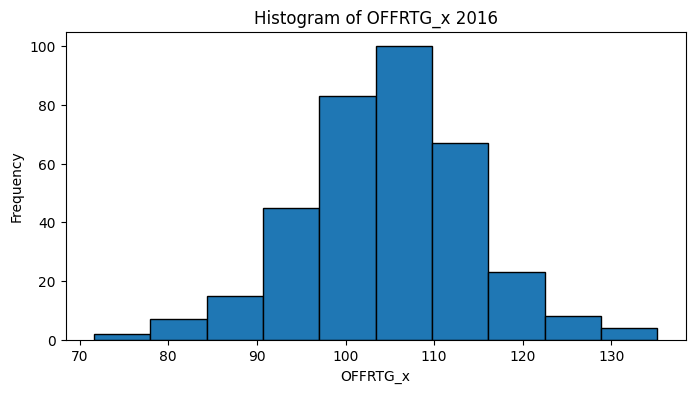

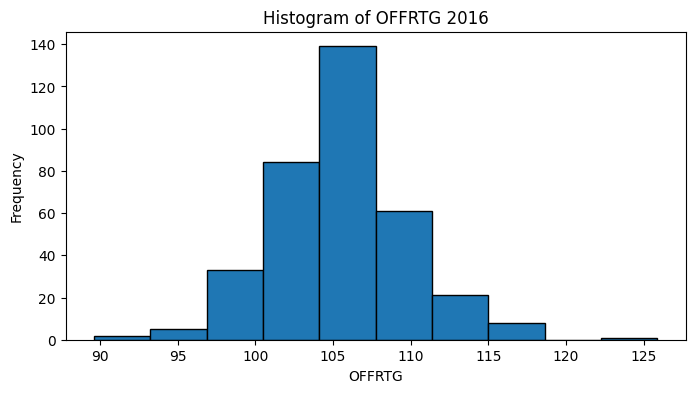

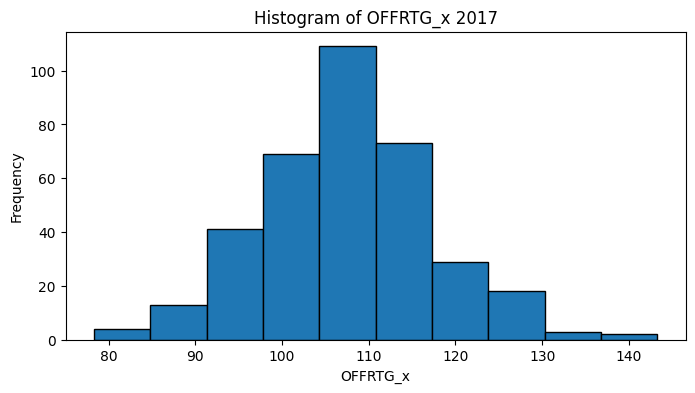

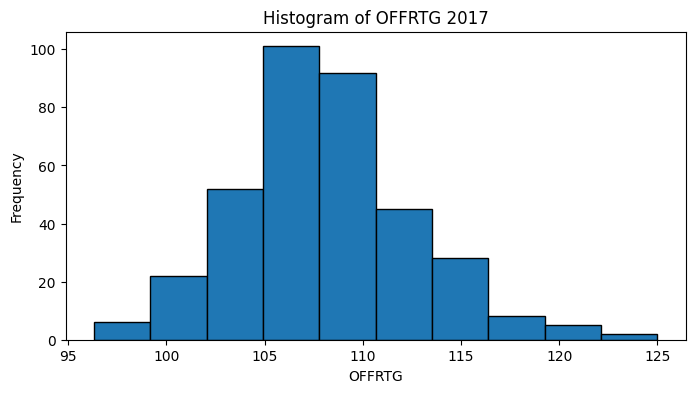

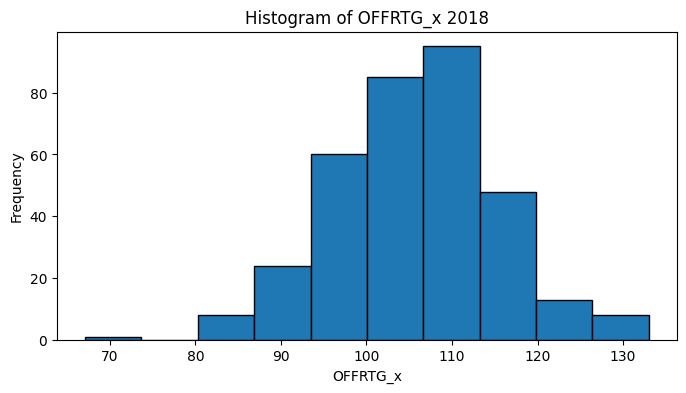

...

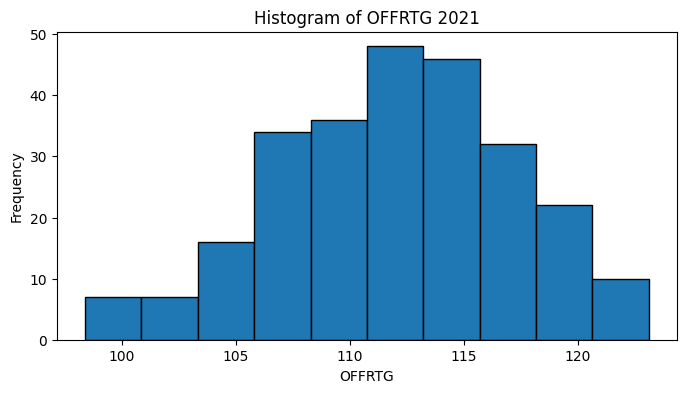

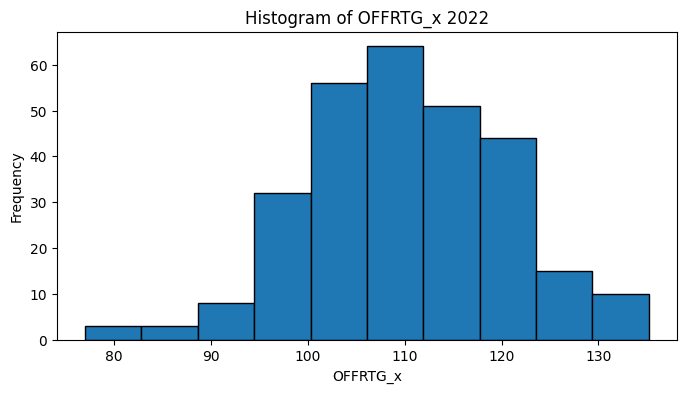

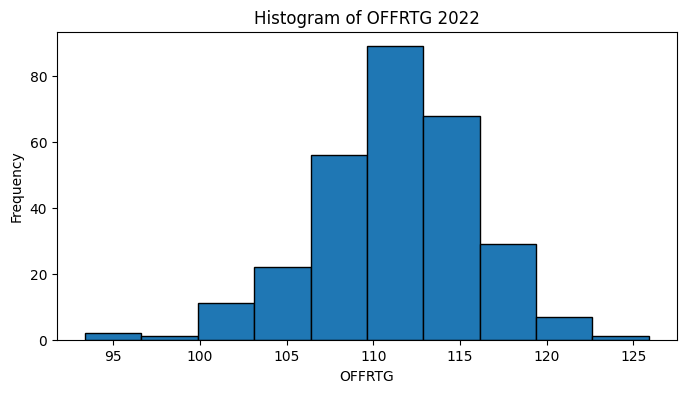

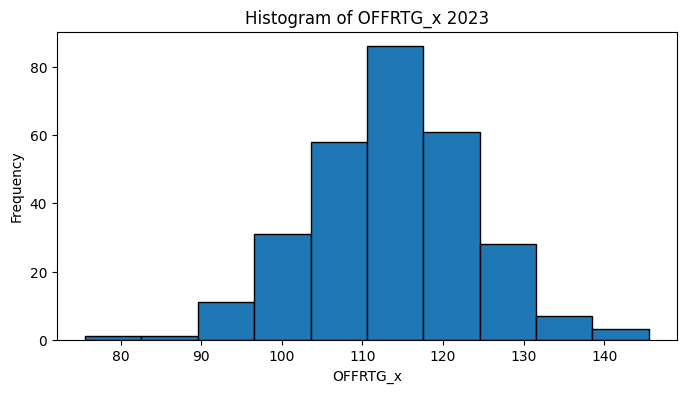

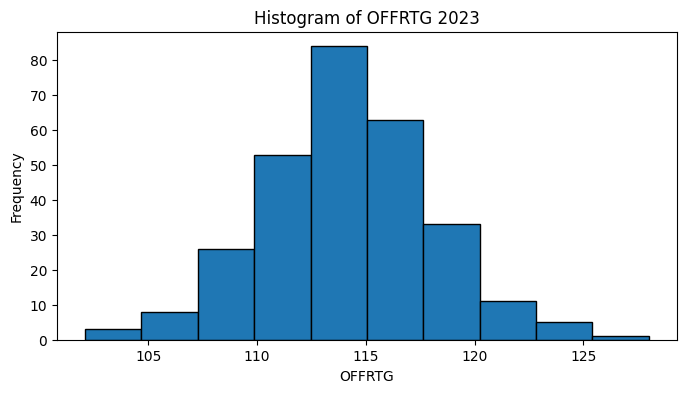

,OFFRTG_x,OFFRTG
0,105.2,105.200000
1,104.3,104.300000
2,114.3,114.300000
3,103.6,103.600000
4,106.4,106.400000
...,...,...
282,94.1,112.194000
283,113.9,113.817000
284,100.9,108.400000
285,123.0,115.416667


In [11]:
for y, lineups in lineups_dict.items():
    
    OFFRTG_df = pd.concat([OFFRTG_df, lineups[["OFFRTG_x", "OFFRTG"]]])
    
    plt.figure(figsize=(8, 4))
    plt.hist(lineups['OFFRTG_x'], bins=10, edgecolor='k')
    plt.title("Histogram of OFFRTG_x 20"+str(y))
    plt.xlabel('OFFRTG_x')
    plt.ylabel('Frequency')
    plt.show()

    plt.figure(figsize=(8, 4))
    plt.hist(lineups['OFFRTG'], bins=10, edgecolor='k')
    plt.title(f'Histogram of OFFRTG 20'+str(y))
    plt.xlabel('OFFRTG')
    plt.ylabel('Frequency')
    plt.show()  
OFFRTG_df

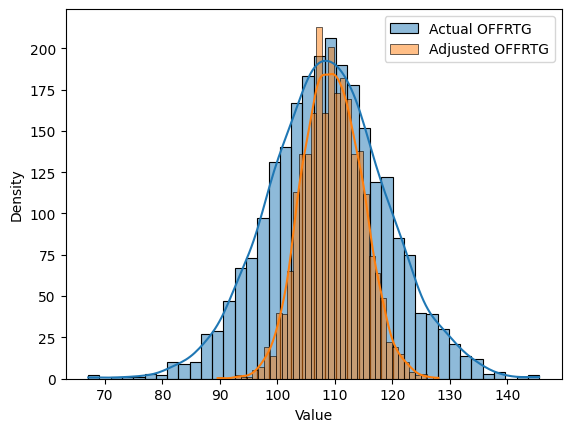

In [12]:
sns.histplot(OFFRTG_df["OFFRTG_x"],kde=True, label="Actual OFFRTG")
sns.histplot(OFFRTG_df["OFFRTG"],kde=True, label="Adjusted OFFRTG")
plt.title("")
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.show()

In [13]:
for y, lineups in lineups_dict.items():
    for i, lineup in lineups.iterrows():
        m_williams_count = 0
        j_green_count = 0
        c_martin_count = 0
        j_williams_count = 0
        
        for n in range(1, 6):
            player_name = lineup["PLAYER"+str(n)]
            if player_name[-1] == " ":
                player_name = player_name[:-1]
            if player_name[0] == " ":
                player_name = player_name[1:]

            if player_name == "J. Green":
                if (y > 16 and lineup["TEAM"] == "MEM") or (y == 21 and lineup["TEAM"] == "DEN") or lineup["TEAM"] == "GSW" or lineup["TEAM"] == "LAC":
                    player_name = "JaMychal Green"
                elif lineup["TEAM"] == "HOU":
                    player_name = "Jalen Green"
                elif lineup["TEAM"] == "DAL":
                    player_name = "Josh Green"
                elif y == 22 and lineup["TEAM"] == "DEN":
                    j_green_count += 1
                    if j_green_count == 1:
                        player_name = "JaMychal Green"
                    else: 
                        player_name = "Jeff Green"
                else:
                    player_name = "Jeff Green"
                    
            if player_name == "D. Green":
                if lineup["TEAM"] == "GSW":
                    player_name = "Draymond Green"
                else:
                    player_name = "Danny Green"
                    
            if player_name == "S. Curry":
                if lineup["TEAM"] == "GSW":
                    player_name = "Stephen Curry"
                else:
                    player_name = "Seth Curry"
                    
            if player_name == "M. Morris":
                if (y == 23 and lineup["TEAM"] == "WAS") or lineup["TEAM"] == "DEN":
                    player_name = "Monte Morris"
                elif lineup["TEAM"] == "DET" or lineup["TEAM"] == "BOS" or lineup["TEAM"] == "NYK" or lineup["TEAM"] == "LAC":
                    player_name = "Marcus Morris"
                else:
                    player_name = "Markieff Morris"
            
            if player_name == "M. Morris Sr.":
                player_name = "Marcus Morris"
                        
            if player_name == "J. Smith":
                if lineup["TEAM"] == "CLE":
                    player_name = "JR Smith"
                elif lineup["TEAM"] == "ORL" or lineup["TEAM"] == "WAS" or lineup["TEAM"] == "MIL":
                    player_name = "Jason Smith"
                elif y > 20:
                    player_name = "Jalen Smith"
                else:
                    player_name = "Josh Smith"
                    
            if player_name == "J. Johnson":
                if lineup["TEAM"] == "SAC" or lineup["TEAM"] == "TOR" or (y >= 17 and lineup["TEAM"] == "MIA"):
                    player_name = "James Johnson"
                else:
                    player_name = "Joe Johnson"
                    
            if player_name == "D. Williams":
                if lineup["TEAM"] == "BKN" or lineup["TEAM"] == "DAL": 
                    player_name = "Deron Williams"
                else:
                    player_name = "Derrick Williams"
                    
            if player_name == "M. Williams":
                if lineup["TEAM"] == "CHA" or (y == 14 and lineup["TEAM"] == "UTA"): 
                    player_name = "Marvin Williams"
                elif y == 13 and lineup["TEAM"] == "UTA":
                    m_williams_count += 1
                    if m_williams_count == 1:
                        player_name = "Marvin Williams"
                    else:
                        player_name = "Mo Williams"
                else:
                    player_name = "Mo Williams"
                    
            if player_name == "T. Young":
                if lineup["TEAM"] == "ATL": 
                    player_name = "Trae Young"
                else:
                    player_name = "Thaddeus Young"
                    
            if player_name == "J. Grant":
                if lineup["TEAM"] == "NYK" or lineup["TEAM"] == "CHI" or lineup["TEAM"] == "ORL":
                    player_name = "Jerian Grant"
                else:
                    player_name = "Jerami Grant"
                    
            if player_name == "M. Plumlee":
                if lineup["TEAM"] == "ATL" or lineup["TEAM"] == "MIL":
                    player_name = "Miles Plumlee"
                else:
                    player_name = "Mason Plumlee"
            
            if player_name == "J. Anderson":
                if lineup["TEAM"] == "SAC":
                    player_name = "James Anderson"
                else:
                    player_name = "Justin Anderson"
                    
            if player_name == "J. Holiday":
                if lineup["TEAM"] == "NOP" or lineup["TEAM"] == "MIL":
                    player_name = "Jrue Holiday"
                else:
                    player_name = "Justin Holiday"
                    
            if player_name == "A. Wiggins":
                if lineup["TEAM"] == "OKC":
                    player_name = "Aaron Wiggins"
                else:
                    player_name = "Andrew Wiggins"
            
            if player_name == "B. Bogdanovic":
                if lineup["TEAM"] == "SAC" or lineup["TEAM"] == "ATL":
                    player_name = "Bogdan Bogdanovic"
                else:
                    player_name = "Bojan Bogdanovic"
                    
            if player_name == "J .Jackson":
                if lineup["TEAM"] == "PHX" or lineup["TEAM"] == "MEM" or lineup["TEAM"] == "DET":
                    player_name = "Josh Jackson"
                else:
                    player_name = "Justin Jackson"
            
            if player_name == "T. Jones":
                if lineup["TEAM"] == "MEM" or lineup["TEAM"] == "MIN":
                    player_name = "Tyus Jones"
                elif lineup["TEAM"] == "SAS":
                    player_name = "Tre Jones" 
                else:
                    player_name = "Terrence Jones"
                
            if player_name == "M. Bridges":
                if lineup["TEAM"] == "CHA":
                    player_name = "Miles Bridges"
                else:
                    player_name = "Mikal Bridges"
                
            if player_name == "C. Anthony":
                if lineup["TEAM"] == "ORL":
                    player_name = "Cole Anthony"
                else:
                    player_name = "Carmelo Anthony"
            
            if player_name == "L. Ball":
                if lineup["TEAM"] == "CHA":
                    player_name = "LaMelo Ball"
                else:
                    player_name = "Lonzo Ball"
            
            if player_name == "J. McDaniels":
                if lineup["TEAM"] == "MIN":
                    player_name = "Jaden McDaniels"
                else:
                    player_name = "Jalen McDaniels"
                    
            if player_name == "C. Martin":
                if lineup["TEAM"] == "MIA":
                    player_name = "Caleb Martin"
                elif y > 21 and lineup["TEAM"] == "CHA":
                    player_name = "Cody Martin"
                else:
                    c_martin_count += 1
                    if c_martin_count == 1:
                        player_name = "Caleb Martin"
                    else: 
                        player_name = "Cody Martin"
            
            if player_name == "T. Mann":
                if lineup["TEAM"] == "LAC":
                    player_name = "Terance Mann"
                else:
                    player_name = "Tre Mann"
            
            if player_name == "D. Mitchell":
                if lineup["TEAM"] == "SAC":
                    player_name = "Davion Mitchell"
                else:
                    player_name = "Donovan Mitchell"
                    
            if player_name == "K. Johnson":
                if lineup["TEAM"] == "SAS":
                    player_name = "Keldon Johnson"
                else:
                    player_name = "Keon Johnson"
            
            if player_name == "M. Beasley":
                if lineup["TEAM"] == "DEN" or lineup["TEAM"] == "MIN" or lineup["TEAM"] == "UTA" or (y == 23 and lineup["TEAM"] == "LAL"):
                    player_name = "Malik Beasley"
                else:
                    player_name = "Michael Beasley"
                    
            if player_name == "J. Williams":
                j_williams_count += 1
                if j_williams_count == 1:
                    player_name = "Jalen Williams"
                else:
                    player_name = "Jaylin Williams"
                    
            print(player_name)
            if i == 5 and (m_williams_count == 1 or j_green_count == 1 or c_martin_count == 1 or j_williams_count == 1):
                continue    
            lineups.loc[i, "PLAYER"+str(n)] = player_name+str(y)

E. Ilyasova
Marcus Morris
R. Jackson
A. Drummond
K. Caldwell-Pope
K. Korver
P. Millsap
A. Horford
J. Teague
K. Bazemore
K. Durant
R. Westbrook
S. Ibaka
A. Roberson
S. Adams
Carmelo Anthony
J. Calderon
A. Afflalo
R. Lopez
K. Porzingis
A. Johnson
A. Bradley
I. Thomas
J. Sullinger
J. Crowder
T. Duncan
T. Parker
L. Aldridge
Danny Green
K. Leonard
R. Rubio
G. Dieng
Z. LaVine
Andrew Wiggins
K. Towns
A. Aminu
D. Lillard
C. McCollum
Mason Plumlee
N. Vonleh
K. Bryant
R. Hibbert
J. Clarkson
J. Randle
D. Russell
A. Bogut
Stephen Curry
K. Thompson
H. Barnes
Draymond Green
G. Monroe
K. Middleton
M. Carter-Williams
G. Antetokounmpo
J. Parker
L. James
JR Smith
K. Love
K. Irving
T. Thompson
Marcus Morris
T. Harris
R. Jackson
A. Drummond
K. Caldwell-Pope
I. Mahinmi
M. Ellis
G. Hill
P. George
M. Turner
D. Nowitzki
Z. Pachulia
Deron Williams
W. Matthews
C. Parsons
Joe Johnson
Thaddeus Young
B. Lopez
W. Ellington
D. Sloan
Marvin Williams
C. Lee
N. Batum
K. Walker
C. Zeller
P. Pierce
C. Paul
J. Redick
D. J

In [14]:
lineups_dict[23][:6]

,LINEUPS,TEAM,GP_x,MIN_x,OFFRTG_x,DEFRTG_x,NETRTG_x,AST%_x,AST/TO_x,AST RATIO_x,...,OREB%_y,DREB%_y,REB%_y,TOV%,EFG%_y,TS%_y,PACE_y,PIE_y,POSS,OFFRTG
0,H. Barnes - D. Sabonis - D. Fox - K. Huerter -...,SAC,63,900,118.3,116.1,2.2,62.0,2.30,19.4,...,26.5,73.1,49.9,13.3,57.2,60.8,100.99,51.1,"8,343",118.3
1,C. Capela - D. Murray - J. Collins - T. Young ...,ATL,44,738,115.9,110.6,5.3,56.9,2.25,18.4,...,28.9,71.7,50.0,12.6,54.1,57.9,101.56,50.0,"8,407",115.9
2,K. Caldwell-Pope - A. Gordon - N. Jokic - J. M...,DEN,41,706,124.3,111.2,13.1,69.8,2.66,23.2,...,28.9,72.7,51.4,14.7,57.3,60.1,98.74,52.5,"8,129",124.3
3,D. DeRozan - N. Vucevic - Z. LaVine - P. Willi...,CHI,48,591,110.2,109.8,0.4,61.7,1.96,19.7,...,23.6,73.6,49.3,13.3,55.0,58.7,99.18,51.2,"8,225",110.2
4,G. Harris - M. Fultz - W. Carter Jr. - F. Wagn...,ORL,36,570,113.0,111.6,1.4,60.8,1.87,18.8,...,28.1,73.0,50.5,15.1,53.2,57.3,99.66,48.5,"8,205",113.0
5,D. Lillard - J. Grant - J. Nurkic - J. Hart - ...,POR,33,541,115.0,115.5,-0.5,62.0,1.65,18.7,...,26.4,70.9,48.6,14.5,54.9,58.9,99.25,47.4,"8,157",115.0


In [15]:
lineups_dict[16] = lineups_dict[16].dropna(axis=1)
lineups_dict[16]

,LINEUPS,TEAM,GP_x,MIN_x,OFFRTG_x,DEFRTG_x,NETRTG_x,AST%_x,AST/TO_x,AST RATIO_x,...,OREB%_y,DREB%_y,REB%_y,TOV%,EFG%_y,TS%_y,PACE_y,PIE_y,POSS,OFFRTG
0,E. Ilyasova - M. Morris - R. Jackson - A. Drum...,DET,48,915,105.2,101.5,3.8,48.1,1.45,14.3,...,31.3,75.3,52.1,14.0,49.1,52.2,95.75,48.6,"7,942",105.200000
1,K. Korver - P. Millsap - A. Horford - J. Teagu...,ATL,70,892,104.3,100.5,3.8,70.8,1.94,20.5,...,23.4,69.8,47.4,15.2,51.6,55.2,97.63,52.8,"8,059",104.300000
2,K. Durant - R. Westbrook - S. Ibaka - A. Rober...,OKC,59,816,114.3,96.5,17.8,61.9,1.82,19.4,...,34.7,72.0,54.1,16.2,52.4,56.5,97.54,54.6,"8,061",114.300000
3,C. Anthony - J. Calderon - A. Afflalo - R. Lop...,NYK,50,735,103.6,105.9,-2.3,50.1,1.41,15.3,...,28.0,71.8,50.2,14.2,48.3,52.7,94.12,48.7,"7,763",103.600000
4,A. Johnson - A. Bradley - I. Thomas - J. Sulli...,BOS,60,723,106.4,104.1,2.4,67.9,2.23,19.8,...,29.0,70.7,49.5,13.8,48.8,53.1,99.43,52.0,"8,191",106.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,K. Humphries - T. Sefolosha - P. Millsap - D. ...,ATL,20,50,99.0,96.0,3.0,60.0,1.91,15.6,...,23.4,69.8,47.4,15.2,51.6,55.2,97.63,52.8,"8,059",103.666667
350,L. Thomas - D. Williams - K. Porzingis - L. Ga...,NYK,18,50,82.9,91.0,-8.1,56.3,1.06,13.8,...,28.0,71.8,50.2,14.2,48.3,52.7,94.12,48.7,"7,763",100.400000
351,M. Williams - S. Hawes - J. Lin - J. Lamb - C....,CHA,9,50,92.5,94.2,-1.8,67.6,1.25,17.7,...,24.4,75.4,49.9,12.9,50.2,54.5,96.24,51.1,"7,966",104.083333
352,N. Bjelica - G. Dieng - S. Muhammad - Z. LaVin...,MIN,19,50,105.0,105.7,-0.7,55.3,1.17,15.6,...,27.9,70.2,49.4,15.5,49.8,54.9,96.20,49.7,"7,965",105.333333


In [16]:
lineups_dict[23][lineups_dict[23]["TEAM"]=="DEN"].iloc[2,:]

LINEUPS        K. Caldwell-Pope - A. Gordon - N. Jokic - B. B...
TEAM                                                         DEN
GP_x                                                          34
MIN_x                                                        224
OFFRTG_x                                                   122.1
DEFRTG_x                                                   108.1
NETRTG_x                                                    13.9
AST%_x                                                      70.7
AST/TO_x                                                    2.53
AST RATIO_x                                                 22.4
OREB%_x                                                     24.5
DREB%_x                                                     74.7
REB%_x                                                      51.0
TO RATIO                                                     0.1
EFG%_x                                                      60.3
TS%_x                    

In [17]:
with open('../pickle_files/lineups_dict2.pkl', 'wb') as f:
    pickle.dump(lineups_dict, f)

In [18]:
lineups_dict[22][["TEAM", "PLAYER1", "PLAYER2", "PLAYER3", "PLAYER4", "PLAYER5"]]

,TEAM,PLAYER1,PLAYER2,PLAYER3,PLAYER4,PLAYER5
0,DEN,JaMychal Green22,W. Barton22,A. Gordon22,N. Jokic22,Monte Morris22
1,PHX,C. Paul22,J. Crowder22,D. Booker22,Mikal Bridges22,D. Ayton22
2,UTA,M. Conley22,Bojan Bogdanovic22,R. Gobert22,R. O'Neale22,Donovan Mitchell22
3,BOS,A. Horford22,M. Smart22,J. Brown22,J. Tatum22,R. Williams III22
4,MIN,P. Beverley22,D. Russell22,K. Towns22,J. Vanderbilt22,A. Edwards22
...,...,...,...,...,...,...
281,WAS,K. Caldwell-Pope22,R. Neto22,K. Kuzma22,D. Gafford22,D. Avdija22
282,MIN,P. Beverley22,K. Towns22,J. Vanderbilt22,A. Edwards22,Jaden McDaniels22
283,DAL,T. Hardaway Jr.22,K. Porzingis22,D. Finney-Smith22,J. Brunson22,L. Doncic22
284,PHI,T. Harris22,Seth Curry22,J. Embiid22,F. Korkmaz22,T. Maxey22


In [19]:
lineup_cluster_dict = {}
for y, lineups in lineups_dict.items():
    for n in range(1, 6):
        df = df_name_clusters.rename(columns={"name": 'PLAYER'+str(n),
                                              "STB": "STB"+str(n),
                                              "ISA": "ISA"+str(n),
                                              "PUB": "PUB"+str(n),
                                              "SBH": "SBH"+str(n),
                                              "TRA": "TRA"+str(n),
                                              "PBH": "PBH"+str(n),
                                              "SUS": "SUS"+str(n),
                                              "RCB": "RCB"+str(n),
                                              "WWH": "WWH"+str(n),
                                              "OSS": "OSS"+str(n)})
        lineups = pd.merge(lineups, df, on="PLAYER"+str(n), how="left")
    
    print(lineups)
    
    for i in range(len(lineups)):
        lineup_sum = 0
        for cluster in cluster_names:
            cluster_sum = 0
            for n in range(1, 6):
                cluster_sum += lineups.loc[i, cluster+str(n)]
            lineups.loc[i, cluster] = cluster_sum
            lineup_sum += cluster_sum
        if 4.9 < lineup_sum < 5.1:
            continue
    lineups.dropna(inplace=True)
    lineup_cluster_dict[y] = lineups

                                               LINEUPS TEAM  GP_x  MIN_x  \
0    E. Ilyasova - M. Morris - R. Jackson - A. Drum...  DET    48    915   
1    K. Korver - P. Millsap - A. Horford - J. Teagu...  ATL    70    892   
2    K. Durant - R. Westbrook - S. Ibaka - A. Rober...  OKC    59    816   
3    C. Anthony - J. Calderon - A. Afflalo - R. Lop...  NYK    50    735   
4    A. Johnson - A. Bradley - I. Thomas - J. Sulli...  BOS    60    723   
..                                                 ...  ...   ...    ...   
349  K. Humphries - T. Sefolosha - P. Millsap - D. ...  ATL    20     50   
350  L. Thomas - D. Williams - K. Porzingis - L. Ga...  NYK    18     50   
351  M. Williams - S. Hawes - J. Lin - J. Lamb - C....  CHA     9     50   
352  N. Bjelica - G. Dieng - S. Muhammad - Z. LaVin...  MIN    19     50   
353  N. Collison - A. Morrow - E. Kanter - D. Waite...  OKC    13     50   

     OFFRTG_x  DEFRTG_x  NETRTG_x  AST%_x  AST/TO_x  AST RATIO_x  ...  \
0       105.2 

In [20]:
pairs_lineups_dict = {}
for y in range(16,24):
    interaction_lineups = pd.DataFrame(index=lineup_cluster_dict[y].reset_index(drop=True).index,
                                columns=["STB_STB",
                                            "STB_ISA", 
                                            "STB_PUB",
                                            "STB_SBH",
                                            "STB_TRA",
                                            "STB_PBH",
                                            "STB_SUS",
                                            "STB_RCB",
                                            "STB_OSS",
                                            "STB_WWH",
                                            "ISA_ISA",
                                            "ISA_PUB",
                                            "ISA_SBH",
                                            "ISA_TRA",
                                            "ISA_PBH",
                                            "ISA_SUS",
                                            "ISA_RCB",
                                            "ISA_OSS",
                                            "ISA_WWH",
                                            "PUB_PUB",
                                            "PUB_SBH",
                                            "PUB_TRA",
                                            "PUB_PBH",
                                            "PUB_SUS",
                                            "PUB_RCB",
                                            "PUB_OSS",
                                            "PUB_WWH",
                                            "SBH_SBH",
                                            "SBH_TRA",
                                            "SBH_PBH",
                                            "SBH_SUS",
                                            "SBH_RCB",
                                            "SBH_OSS",
                                            "SBH_WWH",
                                            "TRA_TRA",
                                            "TRA_PBH",
                                            "TRA_SUS",
                                            "TRA_RCB",
                                            "TRA_OSS",
                                            "TRA_WWH",
                                            "PBH_PBH",
                                            "PBH_SUS",
                                            "PBH_RCB",
                                            "PBH_OSS",
                                            "PBH_WWH",
                                            "SUS_SUS",
                                            "SUS_RCB",
                                            "SUS_OSS",
                                            "SUS_WWH",
                                            "RCB_RCB",
                                            "RCB_OSS",
                                            "RCB_WWH",
                                            "OSS_OSS",
                                            "OSS_WWH",
                                            "WWH_WWH",
                                            ])
    interaction_lineups.fillna(0, inplace=True)
    pairs_lineups_dict[y] = interaction_lineups
pairs_lineups_dict[16]

,STB_STB,STB_ISA,STB_PUB,STB_SBH,STB_TRA,STB_PBH,STB_SUS,STB_RCB,STB_OSS,STB_WWH,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
342,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
343,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
344,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [21]:
lineups_16 = lineup_cluster_dict[16].reset_index(drop=True)
for i in range(len(lineups_16)):
    for m in range(1,5):
        left_col_vector = np.array([lineups_16.loc[i, ["STB"+str(m),
                                                    "ISA"+str(m),                                                                
                                                    "PUB"+str(m),                                                                
                                                    "SBH"+str(m),
                                                    "TRA"+str(m),
                                                    "PBH"+str(m),
                                                    "SUS"+str(m),
                                                    "RCB"+str(m),
                                                    "OSS"+str(m),                                                                
                                                    "WWH"+str(m),
                                                    ]]]).T
        print(left_col_vector)
        for n in range(m+1, 6):
            right_row_vector = np.array([lineups_16.loc[i, ["STB"+str(n),
                                                            "ISA"+str(n),                                                                
                                                            "PUB"+str(n),                                                                
                                                            "SBH"+str(n),
                                                            "TRA"+str(n),
                                                            "PBH"+str(n),
                                                            "SUS"+str(n),
                                                            "RCB"+str(n),
                                                            "OSS"+str(n),                                                                
                                                            "WWH"+str(n),
                                                            ]]])
            print(right_row_vector)
            product_matrix = np.dot(left_col_vector, right_row_vector)
            product_matrix_df = pd.DataFrame(product_matrix, index=cluster_names, columns=cluster_names)
            for cluster1 in cluster_names:
                for cluster2 in cluster_names:
                    if cluster_names.index(cluster1) <= cluster_names.index(cluster2):
                        pairs_lineups_dict[16].loc[i, cluster1+"_"+cluster2] += product_matrix_df.loc[cluster1, cluster2]
                    else:
                        pairs_lineups_dict[16].loc[i, cluster2+"_"+cluster1] += product_matrix_df.loc[cluster1, cluster2]
pairs_lineups_dict[16]

[[0.94018931486638]
 [1.5993115178915956e-05]
 [0.0065370089232955324]
 [9.688453177964906e-06]
 [0.0010309373881943887]
 [9.240211505204526e-07]
 [0.00021530773647848768]
 [0.05185250685601346]
 [3.4901106166177314e-05]
 [0.00011341753396460157]]
[[0.08034997043912616 0.04397641935879691 0.01139500195244997
  0.009655102730346829 0.11189969283477548 0.00024866023809294553
  0.010330556747596153 0.0002684885928807615 0.007461359522783652
  0.724414747583151]]
[[1.827665558578493e-07 0.00014375806790244464 1.7982104038049415e-07
  0.00044204269789673527 3.314311041038363e-07 0.9994075409770738
  1.0708870340601498e-07 7.424443535340461e-08 2.821373751067801e-07
  5.500767912680054e-06]]
[[0.003432335764593109 0.00010442427542480085 0.9524844620498453
  2.882191372710189e-05 0.00016072874341526843 8.723704725198898e-06
  4.246028897106306e-05 0.04360887967596184 3.97908478051699e-05
  8.937273553109558e-05]]
[[8.561897323849578e-06 0.00015396182332200333 3.9108879991478677e-07
  0.000564

,STB_STB,STB_ISA,STB_PUB,STB_SBH,STB_TRA,STB_PBH,STB_SUS,STB_RCB,STB_OSS,STB_WWH,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,7.905597e-02,0.041910,0.983357,0.010171,0.107860,1.023620,0.009837,0.049103,0.007326,1.704624,...,2.958301e-06,1.000420e-03,0.000005,1.076556e-02,2.286881e-03,7.385106e-04,0.164610,2.340384e-06,7.740983e-03,0.722627
1,2.513708e-01,0.000280,0.725992,0.000299,0.570816,1.229408,0.000712,0.000359,1.229723,0.657463,...,8.504288e-08,3.399522e-07,0.000602,8.483351e-05,8.470299e-08,5.790680e-04,0.000310,6.390199e-04,5.344625e-01,0.000177
2,1.164113e-02,1.094177,0.000260,0.014940,0.952468,0.908574,0.030870,1.009772,0.000627,0.003009,...,2.322019e-05,3.166249e-02,0.000003,3.479439e-05,5.065428e-04,6.485199e-04,0.003067,4.976779e-08,8.009053e-07,0.000002
3,2.806306e-02,0.788675,1.086674,1.037427,0.081801,0.007970,0.010430,0.078296,0.705545,0.228937,...,1.355139e-05,8.010479e-04,0.001059,5.949359e-04,1.135995e-04,5.380443e-02,0.017422,2.023830e-03,2.384002e-02,0.006517
4,1.021794e-03,0.478985,0.003349,0.014919,0.533772,0.039316,0.000147,0.528639,0.533764,0.001130,...,1.374559e-08,3.103512e-04,0.000310,6.087403e-07,2.803874e-04,9.932944e-01,0.002139,1.220723e-04,1.684716e-03,0.000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,2.584517e-01,0.000404,0.737648,0.001132,2.274872,1.254096,0.033913,0.000404,0.147026,0.054457,...,1.754639e-05,1.940199e-05,0.000079,4.498724e-05,1.260121e-07,8.386272e-05,0.000031,8.949139e-06,7.651348e-05,0.000027
342,2.714466e-01,0.005286,0.012251,1.266642,0.806216,0.000093,1.120401,0.000553,0.004059,1.305090,...,3.850079e-03,5.194876e-04,0.003533,9.226274e-01,2.441891e-08,3.609522e-07,0.000587,1.245803e-06,3.725841e-03,0.048791
343,2.051032e-01,0.084398,0.002539,1.237949,0.016941,0.000474,0.813049,1.158058,0.040271,1.033079,...,2.586693e-04,7.853965e-01,0.026788,6.898489e-01,1.141408e-04,3.294865e-02,0.844779,6.321366e-06,2.065238e-04,0.001126
344,1.313031e-01,1.933527,0.804436,0.079779,0.886348,0.003218,0.008039,0.082390,0.077260,0.213211,...,1.106635e-04,2.407950e-03,0.001888,5.308951e-03,4.890858e-05,6.035593e-03,0.016633,1.253366e-03,7.688029e-03,0.010966


In [22]:
lineups_17 = lineup_cluster_dict[17].reset_index(drop=True)
for i in range(len(lineups_17)):
    for m in range(1,5):
        left_col_vector = np.array([lineups_17.loc[i, ["STB"+str(m),
                                                    "ISA"+str(m),                                                                
                                                    "PUB"+str(m),                                                                
                                                    "SBH"+str(m),
                                                    "TRA"+str(m),
                                                    "PBH"+str(m),
                                                    "SUS"+str(m),
                                                    "RCB"+str(m),
                                                    "OSS"+str(m),                                                                
                                                    "WWH"+str(m),
                                                    ]]]).T
        print(left_col_vector)
        for n in range(m+1, 6):
            right_row_vector = np.array([lineups_17.loc[i, ["STB"+str(n),
                                                            "ISA"+str(n),                                                                
                                                            "PUB"+str(n),                                                                
                                                            "SBH"+str(n),
                                                            "TRA"+str(n),
                                                            "PBH"+str(n),
                                                            "SUS"+str(n),
                                                            "RCB"+str(n),
                                                            "OSS"+str(n),                                                                
                                                            "WWH"+str(n),
                                                            ]]])
            print(right_row_vector)
            product_matrix = np.dot(left_col_vector, right_row_vector)
            product_matrix_df = pd.DataFrame(product_matrix, index=cluster_names, columns=cluster_names)
            for cluster1 in cluster_names:
                for cluster2 in cluster_names:
                    if cluster_names.index(cluster1) <= cluster_names.index(cluster2):
                        pairs_lineups_dict[17].loc[i, cluster1+"_"+cluster2] += product_matrix_df.loc[cluster1, cluster2]
                    else:
                        pairs_lineups_dict[17].loc[i, cluster2+"_"+cluster1] += product_matrix_df.loc[cluster1, cluster2]
pairs_lineups_dict[17]

[[0.0004541686485133154]
 [5.255304096250134e-06]
 [0.01547210713025707]
 [2.175112696208901e-06]
 [1.2617011089223388e-05]
 [6.341425130486743e-07]
 [3.5648152984255315e-06]
 [0.9840405135772683]
 [3.1521446649067476e-06]
 [5.812113603231176e-06]]
[[6.0104263634559495e-06 0.009997781262206955 6.9128606982692394e-06
  0.0038827537723003127 1.2298978413136632e-05 0.9859485012292424
  2.9841876802292435e-06 1.9130449508127776e-06 7.169600092704969e-06
  0.00013367463805185467]]
[[0.626845512659247 4.13618867175795e-05 0.3711429410484056
  1.0872017317284861e-05 0.0010655878281698472 9.219056193223303e-07
  0.00024088593858877689 0.00036561080441133576 5.939416648528664e-05
  0.00022691174503782402]]


[[0.00021865252903214354 0.7910065405465945 7.220573361964233e-05
  0.023165453828516498 0.0014161979511703717 0.0016725311311747088
  0.00011802464489392622 2.042821366505547e-05 0.07188972431829092
  0.11042024110304237]]
[[2.954168325456263e-06 3.302393555032953e-08 1.0357224254454799e-08
  5.025576397143575e-08 0.9997784043148354 1.0946490006371223e-09
  0.00018710478777842212 5.646699150320993e-09 6.38486800921925e-06
  2.5051482779393477e-05]]
[[6.0104263634559495e-06]
 [0.009997781262206955]
 [6.9128606982692394e-06]
 [0.0038827537723003127]
 [1.2298978413136632e-05]
 [0.9859485012292424]
 [2.9841876802292435e-06]
 [1.9130449508127776e-06]
 [7.169600092704969e-06]
 [0.00013367463805185467]]
[[0.626845512659247 4.13618867175795e-05 0.3711429410484056
  1.0872017317284861e-05 0.0010655878281698472 9.219056193223303e-07
  0.00024088593858877689 0.00036561080441133576 5.939416648528664e-05
  0.00022691174503782402]]
[[0.00021865252903214354 0.7910065405465945 7.220573361964233e-05
 

,STB_STB,STB_ISA,STB_PUB,STB_SBH,STB_TRA,STB_PBH,STB_SUS,STB_RCB,STB_OSS,STB_WWH,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,4.274797e-04,0.502482,0.010005,0.016970,0.628290,0.619753,0.000196,6.170796e-01,0.045108,0.069371,...,9.917086e-08,5.403617e-04,3.126546e-05,0.000048,3.817743e-04,0.070841,0.109078,5.471945e-06,0.000037,0.000043
1,4.800946e-04,1.143525,0.998479,0.753684,0.004298,0.365373,0.000342,4.029906e-05,0.242784,0.483759,...,3.155880e-08,5.810976e-07,2.536962e-05,0.000057,6.642712e-08,0.000411,0.000819,7.703235e-05,0.007158,0.013234
2,7.163046e-05,0.000077,0.002123,0.000043,0.021028,0.034096,0.011074,3.413577e-02,0.033858,0.000080,...,1.861459e-04,3.448483e-01,3.432350e-01,0.001635,7.311399e-04,0.997317,0.005280,3.646224e-04,0.003641,0.000008
3,7.121369e-05,0.011435,0.000024,0.002159,0.016028,0.016496,0.007624,9.217086e-03,0.000548,0.001219,...,9.464728e-04,9.789836e-01,3.450842e-02,0.076780,5.980290e-05,0.034643,0.077084,1.516533e-06,0.000016,0.000029
4,7.212187e-03,0.178931,0.354907,0.378131,0.987183,0.827346,0.009165,6.454663e-01,0.000869,0.620410,...,5.878405e-06,6.178134e-03,6.635533e-06,0.005892,1.675279e-04,0.000558,0.398101,2.556014e-07,0.000357,0.002319
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330,2.123123e-03,0.013038,0.000213,0.708876,0.010009,0.060599,0.009560,7.446955e-01,0.003380,1.424127,...,1.823239e-03,1.603087e-01,7.028917e-04,0.295781,4.257874e-04,0.006052,1.940764,1.018722e-05,0.007381,0.963732
331,2.103972e-03,0.020035,0.117105,0.128611,0.029420,0.000085,0.001266,7.088766e-05,0.002918,0.168569,...,9.729656e-05,1.204423e-05,4.222261e-04,0.027016,5.088637e-08,0.000020,0.001253,3.178985e-04,0.041975,1.342895
332,1.918834e-04,0.000089,0.097707,0.098472,0.006131,0.000008,0.000085,9.742168e-02,0.076670,0.016785,...,6.024027e-06,9.404843e-03,6.858680e-03,0.001788,6.145718e-04,0.785006,0.720755,4.418213e-03,0.441343,0.090042
333,6.896105e-07,0.001293,0.001517,0.001583,0.000466,0.000003,0.001395,2.571245e-07,0.000023,0.000036,...,5.611162e-01,2.632642e-04,2.334499e-02,0.025176,6.144197e-09,0.000006,0.000005,1.481114e-04,0.000749,0.000141


In [23]:
lineups_18 = lineup_cluster_dict[18].reset_index(drop=True)
for i in range(len(lineups_18)):
    for m in range(1,5):
        left_col_vector = np.array([lineups_18.loc[i, ["STB"+str(m),
                                                    "ISA"+str(m),                                                                
                                                    "PUB"+str(m),                                                                
                                                    "SBH"+str(m),
                                                    "TRA"+str(m),
                                                    "PBH"+str(m),
                                                    "SUS"+str(m),
                                                    "RCB"+str(m),
                                                    "OSS"+str(m),                                                                
                                                    "WWH"+str(m),
                                                    ]]]).T
        print(left_col_vector)
        for n in range(m+1, 6):
            right_row_vector = np.array([lineups_18.loc[i, ["STB"+str(n),
                                                            "ISA"+str(n),                                                                
                                                            "PUB"+str(n),                                                                
                                                            "SBH"+str(n),
                                                            "TRA"+str(n),
                                                            "PBH"+str(n),
                                                            "SUS"+str(n),
                                                            "RCB"+str(n),
                                                            "OSS"+str(n),                                                                
                                                            "WWH"+str(n),
                                                            ]]])
            print(right_row_vector)
            product_matrix = np.dot(left_col_vector, right_row_vector)
            product_matrix_df = pd.DataFrame(product_matrix, index=cluster_names, columns=cluster_names)
            for cluster1 in cluster_names:
                for cluster2 in cluster_names:
                    if cluster_names.index(cluster1) <= cluster_names.index(cluster2):
                        pairs_lineups_dict[18].loc[i, cluster1+"_"+cluster2] += product_matrix_df.loc[cluster1, cluster2]
                    else:
                        pairs_lineups_dict[18].loc[i, cluster2+"_"+cluster1] += product_matrix_df.loc[cluster1, cluster2]
pairs_lineups_dict[18]

[[1.379224050904414e-08]
 [7.795420676302336e-05]
 [9.425864720099643e-09]
 [0.000644639044072585]
 [3.614494559241172e-08]
 [0.9992760863915539]
 [7.890961788130493e-09]
 [3.1235134064007876e-09]
 [1.9019207006139308e-08]
 [1.2309608777529604e-06]]
[[0.11480067146986477 2.9380799097479708e-05 0.1226719976346097
  1.4894898295837985e-05 0.0008152179621629266 1.9162634689704696e-06
  0.00014409993802426473 0.7613731443780939 3.8494501884637664e-05
  0.00011018215449743253]]
[[5.906252188352023e-07 0.9919165097689818 6.014174407406012e-07
  0.006894974787654003 1.1467659717748186e-06 0.0010655803763978849
  1.3323155551057387e-07 8.006947306365145e-08 6.955733186588509e-07
  0.0001196873839876795]]
[[0.0003596930731034485 0.030246923059669615 6.507321354380547e-05
  0.014563991232344583 0.002271866458095783 9.897508239835846e-05
  0.00012431636673104415 6.317469634049653e-06 0.0005068084081899283
  0.9517560356362894]]
[[8.875330201485725e-05 3.71872848620001e-08 0.9999073668352428
  1.0

,STB_STB,STB_ISA,STB_PUB,STB_SBH,STB_TRA,STB_PBH,STB_SUS,STB_RCB,STB_OSS,STB_WWH,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,0.000052,0.117802,0.115213,0.002542,0.000262,0.115300,0.000014,0.000343,0.000058,0.109361,...,1.796655e-08,9.480210e-05,7.812141e-08,0.000137,7.545514e-06,0.000386,0.724737,1.991166e-08,0.000037,0.000220
1,0.000142,0.028452,0.053701,0.003864,0.055226,0.054527,0.001898,0.000055,0.009441,0.009607,...,1.041234e-03,6.855263e-04,1.208172e-01,0.122941,1.519491e-07,0.000156,0.000159,3.072597e-05,0.000100,0.000070
2,0.003167,0.575128,0.359484,0.370951,0.156335,0.895054,0.775299,0.566691,0.000308,0.023194,...,4.235543e-02,5.384087e-01,3.000884e-04,0.022033,3.390571e-05,0.000268,0.015485,6.081062e-08,0.000006,0.000025
3,0.000009,0.006606,0.000031,0.011542,0.005979,0.000625,0.006230,0.013040,0.000454,0.008473,...,2.916453e-04,4.879402e-01,6.612222e-04,0.320359,9.195062e-04,0.036518,0.667944,4.652468e-05,0.023794,0.025686
4,0.000015,0.003682,0.005185,0.000425,0.010431,0.003506,0.000096,0.000003,0.007786,0.000042,...,3.571867e-05,9.088080e-06,1.440816e-02,0.000068,4.576909e-08,0.000633,0.000003,5.033301e-03,0.005145,0.000013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
294,0.002781,0.039262,0.000241,0.181388,0.012191,0.012819,0.000161,0.194961,0.215695,0.184165,...,2.072948e-06,4.416673e-03,4.313424e-03,0.003834,1.473971e-04,1.005156,0.860312,2.310128e-02,0.870583,0.003898
295,0.000271,0.036174,0.000163,0.114441,0.002955,0.271858,0.000254,0.210774,0.000250,0.206897,...,2.796589e-05,2.776808e-02,4.205152e-05,0.026517,2.119811e-04,0.012551,1.130820,1.291265e-05,0.011513,0.150972
296,0.000230,0.000203,0.035593,0.035146,0.003181,0.007066,0.000018,0.000007,0.084059,0.003122,...,8.964101e-08,4.359500e-07,5.121965e-03,0.000035,1.700399e-08,0.000533,0.000075,1.011426e+00,0.873179,0.003394
297,0.009723,0.096707,0.507707,0.380811,0.234554,0.027700,0.179661,0.000618,0.060507,0.494606,...,1.239912e-03,1.701156e-03,1.023959e-03,0.220051,4.214307e-06,0.000573,0.004643,2.039296e-04,0.073998,0.248642


In [24]:
lineups_19 = lineup_cluster_dict[19].reset_index(drop=True)
for i in range(len(lineups_19)):
    for m in range(1,5):
        left_col_vector = np.array([lineups_19.loc[i, ["STB"+str(m),
                                                    "ISA"+str(m),                                                                
                                                    "PUB"+str(m),                                                                
                                                    "SBH"+str(m),
                                                    "TRA"+str(m),
                                                    "PBH"+str(m),
                                                    "SUS"+str(m),
                                                    "RCB"+str(m),
                                                    "OSS"+str(m),                                                                
                                                    "WWH"+str(m),
                                                    ]]]).T
        print(left_col_vector)
        for n in range(m+1, 6):
            right_row_vector = np.array([lineups_19.loc[i, ["STB"+str(n),
                                                            "ISA"+str(n),                                                                
                                                            "PUB"+str(n),                                                                
                                                            "SBH"+str(n),
                                                            "TRA"+str(n),
                                                            "PBH"+str(n),
                                                            "SUS"+str(n),
                                                            "RCB"+str(n),
                                                            "OSS"+str(n),                                                                
                                                            "WWH"+str(n),
                                                            ]]])
            print(right_row_vector)
            product_matrix = np.dot(left_col_vector, right_row_vector)
            product_matrix_df = pd.DataFrame(product_matrix, index=cluster_names, columns=cluster_names)
            for cluster1 in cluster_names:
                for cluster2 in cluster_names:
                    if cluster_names.index(cluster1) <= cluster_names.index(cluster2):
                        pairs_lineups_dict[19].loc[i, cluster1+"_"+cluster2] += product_matrix_df.loc[cluster1, cluster2]
                    else:
                        pairs_lineups_dict[19].loc[i, cluster2+"_"+cluster1] += product_matrix_df.loc[cluster1, cluster2]
pairs_lineups_dict[19]

[[0.00046868233702484005]
 [0.6724251926235348]
 [0.000881800904253707]
 [0.03625097221295159]
 [0.0008975681021891285]
 [0.28264939920711546]
 [0.0001559484889673107]
 [0.00010775087411280337]
 [0.0003493774214984307]
 [0.0058133078283519775]]
[[2.4967710414598155e-07 0.9997706682092069 1.4431963232340737e-07
  0.00011085029638438012 1.2293433782857254e-06 1.4136001963694745e-05
  7.381680762306552e-08 2.2771014232084884e-08 1.7695868537417656e-06
  0.0001008559776547541]]
[[0.0031678218226243 5.073402774896938e-05 0.6321256699995588
  1.684946165850717e-05 0.00012297566620515733 4.693545678939664e-06
  2.563727580421249e-05 0.3644094778826039 2.438548716022061e-05
  5.175483095696051e-05]]
[[0.7026879145600688 1.4795521368628498e-05 0.00023024908032339038
  1.6772185338777343e-05 0.2025380475220328 8.575212179590893e-07
  0.0935422961977373 7.497414807427591e-05 0.00014474269630381344
  0.0007493505675341351]]
[[0.0010962654080838357 2.1801519998233126e-05 1.4017325900157438e-05
  4.

[[0.02612492226594433 0.07822047692861449 0.006200513927276232
  0.006544216035164019 0.08196668385924485 0.00016045954685283654
  0.0021138509961820006 0.0001597418708912939 0.017924077735173627
  0.7805850568346564]]
[[0.0001922455124133245 2.0094805674693493e-07 3.5163755666549284e-07
  3.6150108308239207e-07 0.023236239804417667 1.2606549821235356e-08
  0.9765305544008634 1.640650894866363e-07 5.822936936929203e-06
  3.404658703277158e-05]]
[[0.0003263730779267517]
 [2.070959081835194e-06]
 [0.9996319542514341]
 [5.377099623335296e-07]
 [3.17635111887174e-06]
 [1.2266843582021603e-07]
 [1.408226291558843e-06]
 [3.154992820836793e-05]
 [6.637099237205169e-07]
 [2.143117616473288e-06]]
[[0.00015506559954824695 0.23632586417046686 3.6781366560437696e-05
  0.42378035847569695 0.0009143943267518739 0.007011180651059242
  0.00016398394133547323 1.2514348421094127e-05 0.03258743895216825
  0.2990124181679916]]
[[0.02612492226594433 0.07822047692861449 0.006200513927276232
  0.006544216035

,STB_STB,STB_ISA,STB_PUB,STB_SBH,STB_TRA,STB_PBH,STB_SUS,STB_RCB,STB_OSS,STB_WWH,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,3.331308e-03,1.182682,0.445811,0.025753,0.261466,0.199835,0.444588,2.567180e-01,0.000596,0.005572,...,5.893466e-02,0.263349,0.000406,0.004959,6.914141e-05,3.512321e-04,0.003126,3.068055e-07,0.000005,0.000018
1,1.777328e-05,0.006371,0.026469,0.018849,0.000698,0.019407,0.025989,1.286518e-06,0.000881,0.008499,...,2.227100e-03,0.000199,0.049401,1.055186,7.510434e-09,7.044212e-06,0.000092,5.845235e-04,0.030816,0.233622
2,2.128675e-04,0.492743,0.562366,0.035965,0.001679,0.564315,0.563958,2.557158e-03,0.001264,0.036288,...,2.593457e-02,0.005701,0.003613,0.070404,4.872908e-06,1.852335e-05,0.000380,2.982995e-06,0.000096,0.000306
3,6.612970e-04,0.120820,0.002061,0.014612,0.001676,0.001177,0.016870,7.994609e-05,0.000121,0.058452,...,1.325169e-03,0.002027,0.002804,0.999622,2.890596e-08,1.312332e-06,0.002336,1.684599e-06,0.003512,0.090049
4,3.439314e-05,0.000763,0.000010,0.000470,0.000031,0.056191,0.000568,5.561401e-02,0.000018,0.111332,...,1.875212e-05,0.916083,0.000292,1.814199,5.192835e-06,3.719639e-04,1.977424,2.404754e-08,0.000426,0.979180
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285,3.550854e-02,1.057646,0.001671,0.025507,0.889499,0.696129,0.001571,8.116456e-01,0.000118,0.007621,...,1.651750e-05,0.020155,0.000003,0.000175,1.674670e-05,1.548481e-04,0.008588,1.050306e-08,0.000001,0.000017
286,5.466306e-04,0.035911,0.002020,0.063233,0.008809,0.000091,0.000133,3.190656e-05,0.001641,0.768863,...,2.198169e-07,0.000006,0.000003,0.002588,3.433713e-07,7.233838e-05,0.033739,7.393410e-06,0.020466,4.553167
287,6.767720e-05,0.004353,0.006457,0.016787,0.015241,0.000155,0.001263,5.323868e-03,0.016572,0.000158,...,1.177689e-04,0.041004,0.076356,0.001667,7.218795e-04,5.309229e-01,0.011712,1.528013e-03,0.021677,0.000020
288,8.080649e-01,2.146613,0.038684,0.783361,0.125999,1.408106,0.020283,1.823893e-04,0.000891,1.062651,...,2.158106e-05,0.000004,0.000011,0.012576,3.470320e-09,9.847075e-08,0.000119,6.668267e-08,0.000090,0.001485


In [25]:
lineups_20 = lineup_cluster_dict[20].reset_index(drop=True)
for i in range(len(lineups_20)):
    for m in range(1,5):
        left_col_vector = np.array([lineups_20.loc[i, ["STB"+str(m),
                                                    "ISA"+str(m),                                                                
                                                    "PUB"+str(m),                                                                
                                                    "SBH"+str(m),
                                                    "TRA"+str(m),
                                                    "PBH"+str(m),
                                                    "SUS"+str(m),
                                                    "RCB"+str(m),
                                                    "OSS"+str(m),                                                                
                                                    "WWH"+str(m),
                                                    ]]]).T
        print(left_col_vector)
        for n in range(m+1, 6):
            right_row_vector = np.array([lineups_20.loc[i, ["STB"+str(n),
                                                            "ISA"+str(n),                                                                
                                                            "PUB"+str(n),                                                                
                                                            "SBH"+str(n),
                                                            "TRA"+str(n),
                                                            "PBH"+str(n),
                                                            "SUS"+str(n),
                                                            "RCB"+str(n),
                                                            "OSS"+str(n),                                                                
                                                            "WWH"+str(n),
                                                            ]]])
            print(right_row_vector)
            product_matrix = np.dot(left_col_vector, right_row_vector)
            product_matrix_df = pd.DataFrame(product_matrix, index=cluster_names, columns=cluster_names)
            for cluster1 in cluster_names:
                for cluster2 in cluster_names:
                    if cluster_names.index(cluster1) <= cluster_names.index(cluster2):
                        pairs_lineups_dict[20].loc[i, cluster1+"_"+cluster2] += product_matrix_df.loc[cluster1, cluster2]
                    else:
                        pairs_lineups_dict[20].loc[i, cluster2+"_"+cluster1] += product_matrix_df.loc[cluster1, cluster2]
pairs_lineups_dict[20]

[[0.8717035679753875]
 [0.0003016092806755887]
 [0.0821200808037998]
 [7.094519291436792e-05]
 [0.04020231340969505]
 [4.566250474710865e-06]
 [0.0011966824652440945]
 [0.0013795646196528024]
 [0.00045982934143597685]
 [0.0025608406607202008]]
[[2.9660315207295456e-05 0.08465282303187288 5.094948053916935e-06
  0.7902319522799777 0.0004904494291682104 0.0015115996801733057
  1.7943324866130935e-05 2.0181832569517506e-06 7.681125104109376e-05
  0.12298164755638238]]
[[5.939952725321369e-07 1.0162081884705016e-06 2.9279488062431613e-08
  7.457176938888864e-07 4.373559862791786e-05 2.0097588780389335e-08
  2.1648137531561673e-06 1.2854064182477947e-08 0.9998081104973034
  0.00014357093801952968]]
[[0.009160604721164622 0.0036596739516915654 0.9821876982348436
  0.0005100907188098841 0.0005692221200604214 0.0002198747580024499
  0.00020045327364027975 0.002321813531577597 0.00026718441249935223
  0.0009033842777105338]]
[[6.2240417205348325e-06 0.9273150850796337 3.194993103375531e-06
  0.

[[7.397173781741982e-07 0.0028376514637985448 4.49966544342363e-07
  0.024644667396946682 1.9272222233994127e-06 0.9724100347472916
  5.041995556708262e-07 1.5586207825521107e-07 2.3205509892524893e-06
  0.00010154887319421376]]
[[2.0066216404197333e-07]
 [0.00033335999093518035]
 [6.417252195282191e-08]
 [0.9911064092232488]
 [9.262110498716971e-07]
 [0.008426894994258785]
 [2.4345082062786056e-07]
 [2.4187573207965065e-08]
 [1.3699744852335296e-06]
 [0.00013050713294236984]]
[[0.0006149516721747692 1.189331554074282e-05 9.296816782870297e-06
  3.022646888261979e-05 0.031084303419715378 1.7291247527937013e-06
  0.9673714773380037 3.820136890866699e-06 0.00018504322649544075
  0.0006872584807606269]]
[[7.397173781741982e-07 0.0028376514637985448 4.49966544342363e-07
  0.024644667396946682 1.9272222233994127e-06 0.9724100347472916
  5.041995556708262e-07 1.5586207825521107e-07 2.3205509892524893e-06
  0.00010154887319421376]]
[[0.0006149516721747692]
 [1.189331554074282e-05]
 [9.2968167

,STB_STB,STB_ISA,STB_PUB,STB_SBH,STB_TRA,STB_PBH,STB_SUS,STB_RCB,STB_OSS,STB_WWH,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,8.017464e-03,8.946289e-01,8.569749e-01,7.517845e-01,0.001351,0.007815,0.000206,2.039276e-03,0.881122,0.111646,...,2.714871e-07,0.000003,0.001418,0.000178,3.213893e-06,0.003706,0.000473,9.013785e-04,0.129226,0.000788
1,1.547990e-07,6.785073e-06,2.216556e-08,8.798134e-04,0.000010,0.000849,0.000243,8.653439e-04,0.000539,0.000071,...,2.163605e-04,0.967597,0.845416,0.111592,8.294085e-06,0.874117,0.116043,1.649433e-04,0.000825,0.000106
2,2.194505e-07,8.183423e-04,3.592301e-04,8.860311e-04,0.000016,0.000083,0.000642,1.949845e-08,0.000723,0.000061,...,8.239375e-03,0.000052,0.899456,0.075684,8.645380e-11,0.000047,0.000004,1.492900e-05,0.003825,0.000304
3,3.103180e-08,1.521452e-08,4.084694e-09,5.643425e-08,0.000051,0.000358,0.000113,3.487525e-04,0.000358,0.000203,...,2.288776e-02,0.833197,0.836699,0.689541,8.571080e-07,1.006471,0.863102,6.516338e-03,0.865041,0.005608
4,1.023293e-02,8.131031e-02,4.078661e-02,1.973625e-01,0.003142,0.155221,0.054910,9.855887e-02,0.218501,0.003971,...,3.420781e-04,0.528243,0.807622,0.014871,2.216988e-05,0.653969,0.011536,4.904350e-04,0.018807,0.000038
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
224,1.272471e-01,9.928004e-02,2.326310e-01,8.114634e-01,0.769769,0.003725,0.029654,5.621359e-01,0.927103,0.017865,...,1.656278e-03,0.077778,0.118997,0.002296,1.557105e-04,0.654559,0.012746,1.080338e-03,0.020661,0.000073
225,9.984557e-07,2.526723e-03,1.084585e-07,3.117558e-05,0.000635,0.002489,0.002522,4.880487e-04,0.000003,0.001401,...,9.528940e-04,0.998580,0.001649,0.685807,1.931955e-06,0.001645,0.684385,2.226917e-08,0.000011,0.000522
226,9.253285e-03,8.213713e-01,8.584702e-01,5.578731e-02,0.815774,0.006494,0.064604,2.048093e-03,0.882524,0.003635,...,1.027477e-04,0.000274,0.074570,0.000467,3.229119e-06,0.003710,0.000019,8.996516e-04,0.006519,0.000015
227,5.260385e-02,8.684557e-01,9.117422e-01,5.921117e-02,1.629455,0.006872,0.071911,2.918958e-03,0.035886,0.034088,...,4.106098e-04,0.000347,0.003059,0.003039,6.123612e-06,0.000152,0.000151,3.640115e-05,0.000297,0.000237


In [26]:
lineups_21 = lineup_cluster_dict[21].reset_index(drop=True)
for i in range(len(lineups_21)):
    for m in range(1,5):
        left_col_vector = np.array([lineups_21.loc[i, ["STB"+str(m),
                                                    "ISA"+str(m),                                                                
                                                    "PUB"+str(m),                                                                
                                                    "SBH"+str(m),
                                                    "TRA"+str(m),
                                                    "PBH"+str(m),
                                                    "SUS"+str(m),
                                                    "RCB"+str(m),
                                                    "OSS"+str(m),                                                                
                                                    "WWH"+str(m),
                                                    ]]]).T
        print(left_col_vector)
        for n in range(m+1, 6):
            right_row_vector = np.array([lineups_21.loc[i, ["STB"+str(n),
                                                            "ISA"+str(n),                                                                
                                                            "PUB"+str(n),                                                                
                                                            "SBH"+str(n),
                                                            "TRA"+str(n),
                                                            "PBH"+str(n),
                                                            "SUS"+str(n),
                                                            "RCB"+str(n),
                                                            "OSS"+str(n),                                                                
                                                            "WWH"+str(n),
                                                            ]]])
            print(right_row_vector)
            product_matrix = np.dot(left_col_vector, right_row_vector)
            product_matrix_df = pd.DataFrame(product_matrix, index=cluster_names, columns=cluster_names)
            for cluster1 in cluster_names:
                for cluster2 in cluster_names:
                    if cluster_names.index(cluster1) <= cluster_names.index(cluster2):
                        pairs_lineups_dict[21].loc[i, cluster1+"_"+cluster2] += product_matrix_df.loc[cluster1, cluster2]
                    else:
                        pairs_lineups_dict[21].loc[i, cluster2+"_"+cluster1] += product_matrix_df.loc[cluster1, cluster2]
pairs_lineups_dict[21]

[[1.4210344312835092e-06]
 [0.0007793919164141722]
 [1.4833588310893259e-06]
 [0.0022487502548830837]
 [1.742629389485795e-06]
 [0.996934320343763]
 [7.138168288859806e-07]
 [5.713084144753573e-07]
 [1.6878292271407428e-06]
 [2.991750781706194e-05]]
[[1.743513670497764e-05 1.5204486916179275e-07 1.617082885375453e-07
  3.19374243089575e-07 0.0001246576680654947 1.3599078921848626e-08
  0.9998350948870879 3.317193640879038e-08 6.77352354419574e-06
  1.535888618119703e-05]]
[[1.792603642565096e-07 0.9997969852804715 1.3891694562108533e-07
  0.00011019265458384795 7.281122348034828e-07 3.949270959764065e-05
  6.497885632504328e-08 2.038028653649284e-08 1.969022543661461e-06
  5.0228684116038545e-05]]
[[2.451043781337751e-05 1.4547496172097146e-07 1.0331169676239924e-07
  2.2103836029202356e-07 0.97697870096527 7.180339683286412e-09
  0.02295211770274506 3.789743721395976e-08 9.415688025564736e-06
  3.4740303350247404e-05]]


[[0.0017363885507207606 1.8195033373550662e-05 0.9240860364617773
  6.076919590628191e-06 4.7681912848136734e-05 1.5775146670868978e-06
  1.1498367444551784e-05 0.0740627098626679 9.457796590623237e-06
  2.037758031928386e-05]]
[[1.743513670497764e-05]
 [1.5204486916179275e-07]
 [1.617082885375453e-07]
 [3.19374243089575e-07]
 [0.0001246576680654947]
 [1.3599078921848626e-08]
 [0.9998350948870879]
 [3.317193640879038e-08]
 [6.77352354419574e-06]
 [1.535888618119703e-05]]
[[1.792603642565096e-07 0.9997969852804715 1.3891694562108533e-07
  0.00011019265458384795 7.281122348034828e-07 3.949270959764065e-05
  6.497885632504328e-08 2.038028653649284e-08 1.969022543661461e-06
  5.0228684116038545e-05]]
[[2.451043781337751e-05 1.4547496172097146e-07 1.0331169676239924e-07
  2.2103836029202356e-07 0.97697870096527 7.180339683286412e-09
  0.02295211770274506 3.789743721395976e-08 9.415688025564736e-06
  3.4740303350247404e-05]]
[[0.0017363885507207606 1.8195033373550662e-05 0.9240860364617773
 

,STB_STB,STB_ISA,STB_PUB,STB_SBH,STB_TRA,STB_PBH,STB_SUS,STB_RCB,STB_OSS,STB_WWH,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,7.610727e-08,0.001781,4.024348e-05,0.000004,0.001715,0.001773,0.001803,0.000003,3.538491e-08,2.315448e-07,...,2.296089e-02,0.075751,0.000023,0.000138,4.908571e-08,0.000001,0.000010,3.140023e-10,3.640572e-09,8.705634e-09
1,4.049740e-05,0.016958,1.239638e-02,0.000934,0.000104,0.000150,0.015173,0.000022,2.442774e-04,1.460316e-02,...,2.118077e-03,0.005500,0.018431,1.022989,2.398435e-06,0.000089,0.005379,4.160573e-05,3.584656e-03,6.352109e-02
2,1.797261e-05,0.031360,2.247240e-04,0.005473,0.000310,0.000031,0.000101,0.031147,3.588750e-05,5.620766e-02,...,4.509213e-06,0.003868,0.000007,0.004157,7.941234e-03,0.002487,1.855562,1.841777e-06,3.513065e-03,8.722109e-01
3,2.528412e-06,0.000005,1.495665e-07,0.000033,0.000600,0.007966,0.003148,0.003987,8.096574e-05,1.816178e-04,...,2.692950e-02,0.994336,0.099567,0.222420,8.603771e-06,0.103143,0.230623,1.361008e-05,8.491193e-05,1.217637e-04
4,1.281170e-04,0.001441,3.647728e-04,0.110572,0.036194,0.012799,0.025850,0.104855,4.025023e-02,8.692100e-02,...,2.225118e-03,0.258640,0.005254,0.230291,2.485793e-03,0.396100,0.911280,2.785686e-03,3.531183e-01,7.949402e-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229,7.068656e-05,0.000211,2.700707e-02,0.023321,0.059433,0.007803,0.003258,0.002193,6.347675e-04,1.393177e-03,...,2.913763e-02,0.073847,0.019505,0.043636,5.661620e-07,0.001548,0.003446,1.857970e-05,7.818137e-04,3.608143e-04
230,4.635694e-03,0.195604,6.349009e-01,0.379067,0.002477,0.646319,0.000648,0.002902,6.355730e-02,6.471561e-01,...,7.552350e-07,0.000348,0.000092,0.001071,2.088868e-04,0.034241,0.348694,1.678835e-04,8.063298e-02,1.469351e-01
231,4.375440e-05,0.004552,4.464214e-03,0.014603,0.000081,0.000173,0.013463,0.012786,3.012162e-05,3.694741e-03,...,4.871855e-03,1.003253,0.003014,0.342289,2.650773e-04,0.002998,0.341517,9.532877e-07,3.454507e-04,2.320758e-02
232,3.580850e-05,0.026251,1.018354e-03,0.003514,0.000082,0.028172,0.031648,0.000102,3.233147e-02,4.627855e-03,...,4.843500e-04,0.087121,1.011016,0.149779,3.821869e-06,0.088310,0.012987,1.240717e-02,1.501441e-01,2.134480e-04


In [27]:
lineups_22 = lineup_cluster_dict[22].reset_index(drop=True)
for i in range(len(lineups_22)):
    for m in range(1,5):
        left_col_vector = np.array([lineups_22.loc[i, ["STB"+str(m),
                                                    "ISA"+str(m),                                                                
                                                    "PUB"+str(m),                                                                
                                                    "SBH"+str(m),
                                                    "TRA"+str(m),
                                                    "PBH"+str(m),
                                                    "SUS"+str(m),
                                                    "RCB"+str(m),
                                                    "OSS"+str(m),                                                                
                                                    "WWH"+str(m),
                                                    ]]]).T
        print(left_col_vector)
        for n in range(m+1, 6):
            right_row_vector = np.array([lineups_16.loc[i, ["STB"+str(n),
                                                            "ISA"+str(n),                                                                
                                                            "PUB"+str(n),                                                                
                                                            "SBH"+str(n),
                                                            "TRA"+str(n),
                                                            "PBH"+str(n),
                                                            "SUS"+str(n),
                                                            "RCB"+str(n),
                                                            "OSS"+str(n),                                                                
                                                            "WWH"+str(n),
                                                            ]]])
            print(right_row_vector)
            product_matrix = np.dot(left_col_vector, right_row_vector)
            product_matrix_df = pd.DataFrame(product_matrix, index=cluster_names, columns=cluster_names)
            for cluster1 in cluster_names:
                for cluster2 in cluster_names:
                    if cluster_names.index(cluster1) <= cluster_names.index(cluster2):
                        pairs_lineups_dict[22].loc[i, cluster1+"_"+cluster2] += product_matrix_df.loc[cluster1, cluster2]
                    else:
                        pairs_lineups_dict[22].loc[i, cluster2+"_"+cluster1] += product_matrix_df.loc[cluster1, cluster2]
pairs_lineups_dict[22]

[[0.10370235474153752]
 [4.528278674531647e-06]
 [0.003937111093925792]
 [2.5040750234926877e-06]
 [9.522341131381204e-05]
 [3.260649135927945e-07]
 [2.0160089097388833e-05]
 [0.8922155826864275]
 [5.599371853070396e-06]
 [1.661018723347262e-05]]
[[0.08034997043912616 0.04397641935879691 0.01139500195244997
  0.009655102730346829 0.11189969283477548 0.00024866023809294553
  0.010330556747596153 0.0002684885928807615 0.007461359522783652
  0.724414747583151]]
[[1.827665558578493e-07 0.00014375806790244464 1.7982104038049415e-07
  0.00044204269789673527 3.314311041038363e-07 0.9994075409770738
  1.0708870340601498e-07 7.424443535340461e-08 2.821373751067801e-07
  5.500767912680054e-06]]
[[0.003432335764593109 0.00010442427542480085 0.9524844620498453
  2.882191372710189e-05 0.00016072874341526843 8.723704725198898e-06
  4.246028897106306e-05 0.04360887967596184 3.97908478051699e-05
  8.937273553109558e-05]]


[[8.561897323849578e-06 0.00015396182332200333 3.9108879991478677e-07
  0.0005641886567502525 0.001970423839727388 2.4826212520414917e-06
  2.6929200241961998e-05 1.473026779135177e-07 0.00023613140845131004
  0.9970367821614534]]
[[1.264011782792981e-05]
 [0.0018776291316607314]
 [5.544716564144219e-07]
 [0.004253592287431251]
 [0.00020791833970858068]
 [6.4813812733050255e-06]
 [6.620740275286633e-06]
 [1.1649979050953916e-07]
 [1.626353295191209e-05]
 [0.9936181834974241]]
[[1.827665558578493e-07 0.00014375806790244464 1.7982104038049415e-07
  0.00044204269789673527 3.314311041038363e-07 0.9994075409770738
  1.0708870340601498e-07 7.424443535340461e-08 2.821373751067801e-07
  5.500767912680054e-06]]
[[0.003432335764593109 0.00010442427542480085 0.9524844620498453
  2.882191372710189e-05 0.00016072874341526843 8.723704725198898e-06
  4.246028897106306e-05 0.04360887967596184 3.97908478051699e-05
  8.937273553109558e-05]]
[[8.561897323849578e-06 0.00015396182332200333 3.91088799914786

,STB_STB,STB_ISA,STB_PUB,STB_SBH,STB_TRA,STB_PBH,STB_SUS,STB_RCB,STB_OSS,STB_WWH,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,0.010844,0.004787,0.697547,0.001512,0.013653,0.103688,0.001133,0.106632,0.000988,0.833095,...,3.964334e-07,0.009383,0.000001,0.003310,3.929641e-02,6.977867e-03,1.592468e+00,8.743041e-07,0.003526,1.013156
1,0.000012,0.001011,0.000005,0.004047,0.001984,1.224368,0.968567,0.000001,0.000024,0.000120,...,5.560519e-04,0.000287,0.000624,0.534715,6.311715e-10,8.711722e-09,6.689731e-07,3.790524e-08,0.000033,0.000109
2,0.003429,0.000627,0.000082,0.009336,0.771558,1.000104,0.009271,0.015959,0.123586,0.104293,...,2.871238e-04,1.001593,0.003878,0.003287,1.000265e+00,1.232068e-01,1.059723e-01,7.154559e-05,0.000315,0.000215
3,1.002918,1.147153,0.928154,1.080123,0.115581,0.001451,0.023834,0.075416,0.697491,1.907609,...,1.302585e-04,0.001107,0.009913,0.010976,7.359049e-06,3.804006e-04,1.293320e-01,5.040766e-04,0.614715,0.171065
4,0.179094,0.031906,0.504364,0.458371,0.351925,0.353019,0.003678,0.000620,0.002741,0.218776,...,2.192353e-06,0.000261,0.005738,0.000141,2.832761e-07,7.438535e-05,3.417994e-04,9.578302e-04,0.407033,0.000878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258,0.000003,0.000168,0.000005,0.003695,0.000760,0.002695,0.002389,0.002699,0.000064,0.001173,...,7.231443e-02,0.092459,0.049016,1.338792,6.570891e-06,6.236509e-02,7.920139e-01,5.532998e-05,0.005008,0.095630
259,0.000251,0.319266,0.002164,0.009856,0.355421,0.025531,0.022825,0.000837,0.000277,0.303224,...,4.577583e-04,0.014549,0.000117,0.033849,1.741408e-05,5.542253e-04,8.910260e-01,1.483111e-06,0.002005,0.357239
260,0.000321,0.010040,0.055390,0.058708,0.001615,0.000696,0.055424,0.000013,0.000270,0.056631,...,2.885078e-03,0.001709,0.003289,0.191294,1.061523e-07,7.963524e-06,2.177350e-03,5.093990e-05,0.016740,0.302082
261,0.001736,0.015714,0.008522,0.017889,0.041509,0.001538,0.001298,0.000019,0.009280,1.921127,...,3.043528e-08,0.000002,0.000002,0.000088,1.269657e-06,1.433716e-05,2.768001e-03,9.152828e-06,0.002984,0.067421


In [28]:
lineups_23 = lineup_cluster_dict[23].reset_index(drop=True)
for i in range(len(lineups_23)):
    for m in range(1,5):
        left_col_vector = np.array([lineups_23.loc[i, ["STB"+str(m),
                                                    "ISA"+str(m),                                                                
                                                    "PUB"+str(m),                                                                
                                                    "SBH"+str(m),
                                                    "TRA"+str(m),
                                                    "PBH"+str(m),
                                                    "SUS"+str(m),
                                                    "RCB"+str(m),
                                                    "OSS"+str(m),                                                                
                                                    "WWH"+str(m),
                                                    ]]]).T
        print(left_col_vector)
        for n in range(m+1, 6):
            right_row_vector = np.array([lineups_23.loc[i, ["STB"+str(n),
                                                            "ISA"+str(n),                                                                
                                                            "PUB"+str(n),                                                                
                                                            "SBH"+str(n),
                                                            "TRA"+str(n),
                                                            "PBH"+str(n),
                                                            "SUS"+str(n),
                                                            "RCB"+str(n),
                                                            "OSS"+str(n),                                                                
                                                            "WWH"+str(n),
                                                            ]]])
            print(right_row_vector)
            product_matrix = np.dot(left_col_vector, right_row_vector)
            product_matrix_df = pd.DataFrame(product_matrix, index=cluster_names, columns=cluster_names)
            for cluster1 in cluster_names:
                for cluster2 in cluster_names:
                    if cluster_names.index(cluster1) <= cluster_names.index(cluster2):
                        pairs_lineups_dict[23].loc[i, cluster1+"_"+cluster2] += product_matrix_df.loc[cluster1, cluster2]
                    else:
                        pairs_lineups_dict[23].loc[i, cluster2+"_"+cluster1] += product_matrix_df.loc[cluster1, cluster2]
pairs_lineups_dict[23]

[[5.576855810573939e-05]
 [3.566546840470081e-07]
 [1.9174481469077518e-07]
 [3.672382338746655e-07]
 [0.9949028495734535]
 [8.187431970296473e-09]
 [0.0047596904102252865]
 [4.00842225276727e-08]
 [2.9762866643332524e-05]
 [0.00025096468218500635]]
[[0.033032313928345075 0.0017685326153378596 0.881136212542846
  0.00033428850140731814 0.0014884245417331524 0.00010077726866383956
  0.0002195495127120588 0.08091762438285913 0.00019218407824869203
  0.0008100926278469451]]
[[8.538712177621457e-07 0.0973854965511963 5.345691718013937e-07
  0.028654515678715218 1.9152675614980847e-06 0.8738430038361567
  3.133948046187367e-07 1.2381154492702402e-07 1.268720102443521e-06
  0.00011197429952873226]]
[[4.209539295403059e-05 5.8734264922864906e-05 8.059590325159364e-06
  1.754993091383892e-05 0.0001538441509415315 1.1048798660714693e-06
  3.706078448829172e-05 1.4600798025084754e-06 0.9990709741629111
  0.0006091167628744225]]
[[0.042332269537916356 9.559480530375469e-05 0.0001231878437423728
 

[[1.6069314034158626e-07 0.0002659559457373784 1.938235408551062e-07
  0.0002446937337745646 2.475026474048174e-07 0.9994844080151898
  7.639406957093543e-08 5.52364342665894e-08 2.1009207349114096e-07
  3.998563392381194e-06]]
[[0.00014883413327438922 7.03874814918082e-05 2.238103191246599e-06
  6.829919070447849e-05 0.08328425215893877 7.037073453964789e-07
  0.0005391440709478923 4.382776445482611e-07 0.0031093346846919148
  0.9127763681917694]]
[[1.5474487917558835e-05]
 [0.12358181573421494]
 [1.016419897546457e-05]
 [0.4492497941201002]
 [2.0592425563396407e-05]
 [0.42541603785339116]
 [6.3836401928329886e-06]
 [1.8152944839933215e-06]
 [1.4908425319284949e-05]
 [0.0016830138198412241]]
[[0.9883310202068591 7.744978240337507e-06 0.001335968089237245
  6.145329115091841e-06 0.0066610583902096026 3.140635955247395e-07
  0.003310959923150523 4.1888123006007814e-05 5.099179622564709e-05
  0.0002539091003608711]]
[[1.6069314034158626e-07 0.0002659559457373784 1.938235408551062e-07
  0

,STB_STB,STB_ISA,STB_PUB,STB_SBH,STB_TRA,STB_PBH,STB_SUS,STB_RCB,STB_OSS,STB_WWH,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,0.001406,0.007432,0.037392,0.002181,0.080696,0.065947,0.022908,3.435101e-03,0.078564,0.000488,...,3.413663e-03,5.543180e-02,0.685207,0.001277,3.951981e-06,8.871281e-02,1.007691e-03,9.680054e-02,0.012816,0.000021
1,0.000215,0.122498,0.000102,0.444408,0.082342,1.408578,0.000540,9.883511e-01,0.003089,0.903857,...,1.811805e-06,3.856023e-03,0.000010,0.003035,4.419047e-05,3.175110e-03,9.146215e-01,2.076617e-07,0.000067,0.001773
2,0.005917,0.180292,0.162159,0.001760,0.261926,0.001273,0.036679,3.974146e-03,0.024576,0.010574,...,3.833426e-03,1.616293e-02,0.017836,0.006419,5.943051e-04,1.043495e-02,4.525639e-03,5.836544e-03,0.006990,0.001415
3,0.000016,0.016503,0.000479,0.017708,0.029915,0.029333,0.031877,5.809279e-07,0.000009,0.001373,...,2.061173e-02,9.509230e-04,0.000284,0.043020,3.441708e-09,2.668978e-07,4.128118e-05,7.235600e-09,0.000002,0.000111
4,0.000213,1.464311,0.000014,1.464910,0.098976,0.025455,0.019169,2.578551e-06,0.871683,0.055751,...,1.642199e-07,1.135584e-07,0.000008,0.000876,1.389389e-11,5.163574e-06,3.672762e-07,3.937293e-05,0.039825,0.000590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269,0.004530,0.061949,0.000249,0.066852,0.832626,0.829323,2.027172,2.165763e-05,0.001593,0.007783,...,1.350106e+00,6.906067e-04,0.002670,0.013528,6.683936e-09,5.542392e-07,2.704863e-06,9.129168e-07,0.000009,0.000024
270,0.001209,0.000844,0.000418,0.005316,0.180706,0.751416,0.756187,7.990230e-06,0.206577,1.123128,...,4.419178e-03,3.059524e-03,0.272155,1.482120,1.253174e-08,8.362711e-04,4.544578e-03,1.236309e-05,0.273585,0.485276
271,0.000433,0.248407,0.000216,1.450981,0.005501,0.466697,0.000196,9.990931e-01,0.054721,0.770465,...,1.191785e-07,7.912229e-04,0.000033,0.000471,1.419997e-05,5.477327e-02,7.711865e-01,1.550750e-06,0.000343,0.004495
272,0.000011,0.010063,0.006197,0.000677,0.000055,0.000098,0.000039,1.518119e-06,0.000013,0.008974,...,9.068761e-06,3.791865e-06,0.000028,0.014735,2.066437e-08,7.832549e-07,5.362140e-04,3.173785e-06,0.005351,1.005546


In [29]:
lineup_cluster_dict[16]["Season"] = "2015-16"
lineup_cluster_dict[17]["Season"] = "2016-17"
lineup_cluster_dict[18]["Season"] = "2017-18"
lineup_cluster_dict[19]["Season"] = "2018-19"
lineup_cluster_dict[20]["Season"] = "2019-20"
lineup_cluster_dict[21]["Season"] = "2020-21"
lineup_cluster_dict[22]["Season"] = "2021-22"
lineup_cluster_dict[23]["Season"] = "2022-23"

In [30]:
lineups_df = pd.concat(lineup_cluster_dict.values())
lineups_df.reset_index(inplace=True, drop=True)
lineups_df

,LINEUPS,TEAM,GP_x,MIN_x,OFFRTG_x,DEFRTG_x,NETRTG_x,AST%_x,AST/TO_x,AST RATIO_x,...,SBH,TRA,PBH,SUS,RCB,OSS,WWH,Season,AST RATIO,AST
0,E. Ilyasova - M. Morris - R. Jackson - A. Drum...,DET,48,915,105.2,101.5,3.8,48.1,1.45,14.3,...,0.010700,0.115062,0.999668,0.010615,0.095730,0.007772,1.721660,2015-16,NaN,NaN
1,K. Korver - P. Millsap - A. Horford - J. Teagu...,ATL,70,892,104.3,100.5,3.8,70.8,1.94,20.5,...,0.000248,0.464523,0.999968,0.000644,0.000580,1.000249,0.534849,2015-16,NaN,NaN
2,K. Durant - R. Westbrook - S. Ibaka - A. Rober...,OKC,59,816,114.3,96.5,17.8,61.9,1.82,19.4,...,0.014805,0.955392,0.900081,0.031655,1.000501,0.000648,0.003066,2015-16,NaN,NaN
3,C. Anthony - J. Calderon - A. Afflalo - R. Lop...,NYK,50,735,103.6,105.9,-2.3,50.1,1.41,15.3,...,1.016864,0.081544,0.007902,0.010472,0.077015,0.699647,0.227102,2015-16,NaN,NaN
4,A. Johnson - A. Bradley - I. Thomas - J. Sulli...,BOS,60,723,106.4,104.1,2.4,67.9,2.23,19.8,...,0.027941,0.999700,0.073625,0.000315,0.993749,0.999543,0.002156,2015-16,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2265,T. Hardaway Jr. - S. Dinwiddie - C. Wood - M. ...,DAL,9,51,94.1,88.3,5.7,61.3,1.06,14.8,...,0.069731,0.869240,0.864663,2.118477,0.000333,0.001794,0.008751,2022-23,NaN,NaN
2266,T. McConnell - M. Turner - B. Hield - A. Nesmi...,IND,6,51,113.9,132.7,-18.8,62.2,1.75,19.4,...,0.007032,0.239464,0.992947,0.999470,0.003061,0.273525,1.485151,2022-23,NaN,NaN
2267,A. Burks - B. Bogdanovic - I. Stewart - J. Ive...,DET,6,50,100.9,113.1,-12.1,57.5,1.44,16.3,...,1.452039,0.006033,0.467037,0.000792,0.999842,0.054783,0.771315,2022-23,NaN,NaN
2268,L. James - R. Westbrook - A. Davis - L. Walker...,LAL,15,50,123.0,120.4,2.7,64.2,2.43,21.4,...,0.134090,0.017973,0.021218,0.014181,0.000280,0.003531,1.961742,2022-23,NaN,NaN


In [31]:
with open('../pickle_files/lineups_df2.pkl', 'wb') as f:
    pickle.dump(lineups_df, f)

In [32]:
lineup_data2 = pd.concat([lineups_df[["PLAYER1", "PLAYER2", "PLAYER3", "PLAYER4", "PLAYER5", "TEAM", "OFFRTG", "Season"]], lineups_df[cluster_names]], axis=1)
lineup_data2

,PLAYER1,PLAYER2,PLAYER3,PLAYER4,PLAYER5,TEAM,OFFRTG,Season,STB,ISA,PUB,SBH,TRA,PBH,SUS,RCB,OSS,WWH
0,E. Ilyasova16,Marcus Morris16,R. Jackson16,A. Drummond16,K. Caldwell-Pope16,DET,105.200000,2015-16,1.023980,0.044395,0.970417,0.010700,0.115062,0.999668,0.010615,0.095730,0.007772,1.721660
1,K. Korver16,P. Millsap16,A. Horford16,J. Teague16,K. Bazemore16,ATL,104.300000,2015-16,1.229448,0.000245,0.769246,0.000248,0.464523,0.999968,0.000644,0.000580,1.000249,0.534849
2,K. Durant16,R. Westbrook16,S. Ibaka16,A. Roberson16,S. Adams16,OKC,114.300000,2015-16,1.009495,1.083898,0.000460,0.014805,0.955392,0.900081,0.031655,1.000501,0.000648,0.003066
3,Carmelo Anthony16,J. Calderon16,A. Afflalo16,R. Lopez16,K. Porzingis16,NYK,103.600000,2015-16,1.020470,0.782798,1.076187,1.016864,0.081544,0.007902,0.010472,0.077015,0.699647,0.227102
4,A. Johnson16,A. Bradley16,I. Thomas16,J. Sullinger16,J. Crowder16,BOS,106.400000,2015-16,0.534016,0.896970,0.471984,0.027941,0.999700,0.073625,0.000315,0.993749,0.999543,0.002156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2265,T. Hardaway Jr.23,S. Dinwiddie23,C. Wood23,M. Kleber23,Josh Green23,DAL,112.194000,2022-23,0.959157,0.064763,0.043090,0.069731,0.869240,0.864663,2.118477,0.000333,0.001794,0.008751
2266,T. McConnell23,M. Turner23,B. Hield23,A. Nesmith23,C. Duarte23,IND,113.817000,2022-23,0.756754,0.001136,0.241460,0.007032,0.239464,0.992947,0.999470,0.003061,0.273525,1.485151
2267,A. Burks23,Bojan Bogdanovic23,I. Stewart23,J. Ivey23,J. Duren23,DET,108.400000,2022-23,0.999285,0.248650,0.000226,1.452039,0.006033,0.467037,0.000792,0.999842,0.054783,0.771315
2268,L. James23,R. Westbrook23,A. Davis23,L. Walker IV23,A. Reaves23,LAL,115.416667,2022-23,0.006535,1.839374,1.001077,0.134090,0.017973,0.021218,0.014181,0.000280,0.003531,1.961742


In [33]:
with open('../pickle_files/lineup_data2.pkl', 'wb') as f:
    pickle.dump(lineup_data2, f)

In [34]:
pairs_lineups_df = pd.concat(pairs_lineups_dict.values())
pairs_lineups_df.reset_index(inplace=True, drop=True)
pairs_lineups_df

,STB_STB,STB_ISA,STB_PUB,STB_SBH,STB_TRA,STB_PBH,STB_SUS,STB_RCB,STB_OSS,STB_WWH,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,0.079056,0.041910,0.983357,0.010171,0.107860,1.023620,0.009837,0.049103,0.007326,1.704624,...,2.958301e-06,1.000420e-03,0.000005,1.076556e-02,2.286881e-03,7.385106e-04,0.164610,2.340384e-06,7.740983e-03,0.722627
1,0.251371,0.000280,0.725992,0.000299,0.570816,1.229408,0.000712,0.000359,1.229723,0.657463,...,8.504288e-08,3.399522e-07,0.000602,8.483351e-05,8.470299e-08,5.790680e-04,0.000310,6.390199e-04,5.344625e-01,0.000177
2,0.011641,1.094177,0.000260,0.014940,0.952468,0.908574,0.030870,1.009772,0.000627,0.003009,...,2.322019e-05,3.166249e-02,0.000003,3.479439e-05,5.065428e-04,6.485199e-04,0.003067,4.976779e-08,8.009053e-07,0.000002
3,0.028063,0.788675,1.086674,1.037427,0.081801,0.007970,0.010430,0.078296,0.705545,0.228937,...,1.355139e-05,8.010479e-04,0.001059,5.949359e-04,1.135995e-04,5.380443e-02,0.017422,2.023830e-03,2.384002e-02,0.006517
4,0.001022,0.478985,0.003349,0.014919,0.533772,0.039316,0.000147,0.528639,0.533764,0.001130,...,1.374559e-08,3.103512e-04,0.000310,6.087403e-07,2.803874e-04,9.932944e-01,0.002139,1.220723e-04,1.684716e-03,0.000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2265,0.004530,0.061949,0.000249,0.066852,0.832626,0.829323,2.027172,0.000022,0.001593,0.007783,...,1.350106e+00,6.906067e-04,0.002670,1.352844e-02,6.683936e-09,5.542392e-07,0.000003,9.129168e-07,9.383618e-06,0.000024
2266,0.001209,0.000844,0.000418,0.005316,0.180706,0.751416,0.756187,0.000008,0.206577,1.123128,...,4.419178e-03,3.059524e-03,0.272155,1.482120e+00,1.253174e-08,8.362711e-04,0.004545,1.236309e-05,2.735854e-01,0.485276
2267,0.000433,0.248407,0.000216,1.450981,0.005501,0.466697,0.000196,0.999093,0.054721,0.770465,...,1.191785e-07,7.912229e-04,0.000033,4.712166e-04,1.419997e-05,5.477327e-02,0.771186,1.550750e-06,3.429300e-04,0.004495
2268,0.000011,0.010063,0.006197,0.000677,0.000055,0.000098,0.000039,0.000002,0.000013,0.008974,...,9.068761e-06,3.791865e-06,0.000028,1.473511e-02,2.066437e-08,7.832549e-07,0.000536,3.173785e-06,5.350774e-03,1.005546


In [35]:
pairs_lineup_data2 = pd.concat([lineups_df[["TEAM", "OFFRTG", "Season"]], pairs_lineups_df], axis=1)
pairs_lineup_data2

,TEAM,OFFRTG,Season,STB_STB,STB_ISA,STB_PUB,STB_SBH,STB_TRA,STB_PBH,STB_SUS,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,DET,105.200000,2015-16,0.079056,0.041910,0.983357,0.010171,0.107860,1.023620,0.009837,...,2.958301e-06,1.000420e-03,0.000005,1.076556e-02,2.286881e-03,7.385106e-04,0.164610,2.340384e-06,7.740983e-03,0.722627
1,ATL,104.300000,2015-16,0.251371,0.000280,0.725992,0.000299,0.570816,1.229408,0.000712,...,8.504288e-08,3.399522e-07,0.000602,8.483351e-05,8.470299e-08,5.790680e-04,0.000310,6.390199e-04,5.344625e-01,0.000177
2,OKC,114.300000,2015-16,0.011641,1.094177,0.000260,0.014940,0.952468,0.908574,0.030870,...,2.322019e-05,3.166249e-02,0.000003,3.479439e-05,5.065428e-04,6.485199e-04,0.003067,4.976779e-08,8.009053e-07,0.000002
3,NYK,103.600000,2015-16,0.028063,0.788675,1.086674,1.037427,0.081801,0.007970,0.010430,...,1.355139e-05,8.010479e-04,0.001059,5.949359e-04,1.135995e-04,5.380443e-02,0.017422,2.023830e-03,2.384002e-02,0.006517
4,BOS,106.400000,2015-16,0.001022,0.478985,0.003349,0.014919,0.533772,0.039316,0.000147,...,1.374559e-08,3.103512e-04,0.000310,6.087403e-07,2.803874e-04,9.932944e-01,0.002139,1.220723e-04,1.684716e-03,0.000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2265,DAL,112.194000,2022-23,0.004530,0.061949,0.000249,0.066852,0.832626,0.829323,2.027172,...,1.350106e+00,6.906067e-04,0.002670,1.352844e-02,6.683936e-09,5.542392e-07,0.000003,9.129168e-07,9.383618e-06,0.000024
2266,IND,113.817000,2022-23,0.001209,0.000844,0.000418,0.005316,0.180706,0.751416,0.756187,...,4.419178e-03,3.059524e-03,0.272155,1.482120e+00,1.253174e-08,8.362711e-04,0.004545,1.236309e-05,2.735854e-01,0.485276
2267,DET,108.400000,2022-23,0.000433,0.248407,0.000216,1.450981,0.005501,0.466697,0.000196,...,1.191785e-07,7.912229e-04,0.000033,4.712166e-04,1.419997e-05,5.477327e-02,0.771186,1.550750e-06,3.429300e-04,0.004495
2268,LAL,115.416667,2022-23,0.000011,0.010063,0.006197,0.000677,0.000055,0.000098,0.000039,...,9.068761e-06,3.791865e-06,0.000028,1.473511e-02,2.066437e-08,7.832549e-07,0.000536,3.173785e-06,5.350774e-03,1.005546


In [36]:
TEAM_ce_ohe = ce.OneHotEncoder(cols=["TEAM"], handle_unknown='impute', use_cat_names=True)

In [37]:
pairs_lineup_data2_TEAM_ce = TEAM_ce_ohe.fit_transform(pairs_lineup_data2)
pairs_lineup_data2_TEAM_ce

,TEAM_DET,TEAM_ATL,TEAM_OKC,TEAM_NYK,TEAM_BOS,TEAM_SAS,TEAM_MIN,TEAM_POR,TEAM_LAL,TEAM_GSW,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,1,0,0,0,0,0,0,0,0,0,...,2.958301e-06,1.000420e-03,0.000005,1.076556e-02,2.286881e-03,7.385106e-04,0.164610,2.340384e-06,7.740983e-03,0.722627
1,0,1,0,0,0,0,0,0,0,0,...,8.504288e-08,3.399522e-07,0.000602,8.483351e-05,8.470299e-08,5.790680e-04,0.000310,6.390199e-04,5.344625e-01,0.000177
2,0,0,1,0,0,0,0,0,0,0,...,2.322019e-05,3.166249e-02,0.000003,3.479439e-05,5.065428e-04,6.485199e-04,0.003067,4.976779e-08,8.009053e-07,0.000002
3,0,0,0,1,0,0,0,0,0,0,...,1.355139e-05,8.010479e-04,0.001059,5.949359e-04,1.135995e-04,5.380443e-02,0.017422,2.023830e-03,2.384002e-02,0.006517
4,0,0,0,0,1,0,0,0,0,0,...,1.374559e-08,3.103512e-04,0.000310,6.087403e-07,2.803874e-04,9.932944e-01,0.002139,1.220723e-04,1.684716e-03,0.000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2265,0,0,0,0,0,0,0,0,0,0,...,1.350106e+00,6.906067e-04,0.002670,1.352844e-02,6.683936e-09,5.542392e-07,0.000003,9.129168e-07,9.383618e-06,0.000024
2266,0,0,0,0,0,0,0,0,0,0,...,4.419178e-03,3.059524e-03,0.272155,1.482120e+00,1.253174e-08,8.362711e-04,0.004545,1.236309e-05,2.735854e-01,0.485276
2267,1,0,0,0,0,0,0,0,0,0,...,1.191785e-07,7.912229e-04,0.000033,4.712166e-04,1.419997e-05,5.477327e-02,0.771186,1.550750e-06,3.429300e-04,0.004495
2268,0,0,0,0,0,0,0,0,1,0,...,9.068761e-06,3.791865e-06,0.000028,1.473511e-02,2.066437e-08,7.832549e-07,0.000536,3.173785e-06,5.350774e-03,1.005546


In [38]:
pairs_lineup_data2_TEAM_ce.columns = pairs_lineup_data2_TEAM_ce.columns.str.replace('TEAM_', '')
pairs_lineup_data2_TEAM_ce

,DET,ATL,OKC,NYK,BOS,SAS,MIN,POR,LAL,GSW,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,1,0,0,0,0,0,0,0,0,0,...,2.958301e-06,1.000420e-03,0.000005,1.076556e-02,2.286881e-03,7.385106e-04,0.164610,2.340384e-06,7.740983e-03,0.722627
1,0,1,0,0,0,0,0,0,0,0,...,8.504288e-08,3.399522e-07,0.000602,8.483351e-05,8.470299e-08,5.790680e-04,0.000310,6.390199e-04,5.344625e-01,0.000177
2,0,0,1,0,0,0,0,0,0,0,...,2.322019e-05,3.166249e-02,0.000003,3.479439e-05,5.065428e-04,6.485199e-04,0.003067,4.976779e-08,8.009053e-07,0.000002
3,0,0,0,1,0,0,0,0,0,0,...,1.355139e-05,8.010479e-04,0.001059,5.949359e-04,1.135995e-04,5.380443e-02,0.017422,2.023830e-03,2.384002e-02,0.006517
4,0,0,0,0,1,0,0,0,0,0,...,1.374559e-08,3.103512e-04,0.000310,6.087403e-07,2.803874e-04,9.932944e-01,0.002139,1.220723e-04,1.684716e-03,0.000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2265,0,0,0,0,0,0,0,0,0,0,...,1.350106e+00,6.906067e-04,0.002670,1.352844e-02,6.683936e-09,5.542392e-07,0.000003,9.129168e-07,9.383618e-06,0.000024
2266,0,0,0,0,0,0,0,0,0,0,...,4.419178e-03,3.059524e-03,0.272155,1.482120e+00,1.253174e-08,8.362711e-04,0.004545,1.236309e-05,2.735854e-01,0.485276
2267,1,0,0,0,0,0,0,0,0,0,...,1.191785e-07,7.912229e-04,0.000033,4.712166e-04,1.419997e-05,5.477327e-02,0.771186,1.550750e-06,3.429300e-04,0.004495
2268,0,0,0,0,0,0,0,0,1,0,...,9.068761e-06,3.791865e-06,0.000028,1.473511e-02,2.066437e-08,7.832549e-07,0.000536,3.173785e-06,5.350774e-03,1.005546


In [39]:
Season_ce_ohe = ce.OneHotEncoder(cols=["Season"], handle_unknown='impute', use_cat_names=True)

In [40]:
pairs_lineup_data2_TEAM_Season_ce = Season_ce_ohe.fit_transform(pairs_lineup_data2_TEAM_ce)
pairs_lineup_data2_TEAM_Season_ce

,DET,ATL,OKC,NYK,BOS,SAS,MIN,POR,LAL,GSW,...,SUS_SUS,SUS_RCB,SUS_OSS,SUS_WWH,RCB_RCB,RCB_OSS,RCB_WWH,OSS_OSS,OSS_WWH,WWH_WWH
0,1,0,0,0,0,0,0,0,0,0,...,2.958301e-06,1.000420e-03,0.000005,1.076556e-02,2.286881e-03,7.385106e-04,0.164610,2.340384e-06,7.740983e-03,0.722627
1,0,1,0,0,0,0,0,0,0,0,...,8.504288e-08,3.399522e-07,0.000602,8.483351e-05,8.470299e-08,5.790680e-04,0.000310,6.390199e-04,5.344625e-01,0.000177
2,0,0,1,0,0,0,0,0,0,0,...,2.322019e-05,3.166249e-02,0.000003,3.479439e-05,5.065428e-04,6.485199e-04,0.003067,4.976779e-08,8.009053e-07,0.000002
3,0,0,0,1,0,0,0,0,0,0,...,1.355139e-05,8.010479e-04,0.001059,5.949359e-04,1.135995e-04,5.380443e-02,0.017422,2.023830e-03,2.384002e-02,0.006517
4,0,0,0,0,1,0,0,0,0,0,...,1.374559e-08,3.103512e-04,0.000310,6.087403e-07,2.803874e-04,9.932944e-01,0.002139,1.220723e-04,1.684716e-03,0.000001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2265,0,0,0,0,0,0,0,0,0,0,...,1.350106e+00,6.906067e-04,0.002670,1.352844e-02,6.683936e-09,5.542392e-07,0.000003,9.129168e-07,9.383618e-06,0.000024
2266,0,0,0,0,0,0,0,0,0,0,...,4.419178e-03,3.059524e-03,0.272155,1.482120e+00,1.253174e-08,8.362711e-04,0.004545,1.236309e-05,2.735854e-01,0.485276
2267,1,0,0,0,0,0,0,0,0,0,...,1.191785e-07,7.912229e-04,0.000033,4.712166e-04,1.419997e-05,5.477327e-02,0.771186,1.550750e-06,3.429300e-04,0.004495
2268,0,0,0,0,0,0,0,0,1,0,...,9.068761e-06,3.791865e-06,0.000028,1.473511e-02,2.066437e-08,7.832549e-07,0.000536,3.173785e-06,5.350774e-03,1.005546


In [41]:
pairs_lineup_data2_TEAM_Season_ce.columns = pairs_lineup_data2_TEAM_Season_ce.columns.str.replace('Season_', '')
pairs_lineup_data2_TEAM_Season_ce.iloc[:, 30:60]

,OFFRTG,2015-16,2016-17,2017-18,2018-19,2019-20,2020-21,2021-22,2022-23,STB_STB,...,ISA_PUB,ISA_SBH,ISA_TRA,ISA_PBH,ISA_SUS,ISA_RCB,ISA_OSS,ISA_WWH,PUB_PUB,PUB_SBH
0,105.200000,1,0,0,0,0,0,0,0,0.079056,...,0.042481,5.026443e-05,0.000187,0.044225,1.695131e-05,4.232705e-03,0.000017,0.044422,1.715500e-02,0.010246
1,104.300000,1,0,0,0,0,0,0,0,0.251371,...,0.000156,2.880796e-08,0.000046,0.000220,8.281117e-08,1.264928e-07,0.000224,0.000052,2.142364e-02,0.000185
2,114.300000,1,0,0,0,0,0,0,0,0.011641,...,0.000486,1.474461e-02,1.035476,0.899940,3.430666e-02,1.084439e+00,0.000692,0.003150,6.916523e-08,0.000005
3,103.600000,1,0,0,0,0,0,0,0,0.028063,...,0.729840,7.821074e-01,0.058412,0.000709,7.102058e-03,5.923549e-02,0.539248,0.151351,1.442721e-01,1.091769
4,106.400000,1,0,0,0,0,0,0,0,0.001022,...,0.423347,1.231542e-05,0.896673,0.000004,2.788730e-04,8.913606e-01,0.896476,0.000669,2.152905e-03,0.013186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2265,112.194000,0,0,0,0,0,0,0,1,0.004530,...,0.002782,1.844587e-05,0.056287,0.000169,1.371849e-01,2.117918e-05,0.000115,0.000502,1.999687e-06,0.003002
2266,113.817000,0,0,0,0,0,0,0,1,0.001209,...,0.000270,5.693454e-06,0.000082,0.000825,1.131023e-03,3.416851e-06,0.000089,0.001293,9.951822e-06,0.001696
2267,108.400000,0,0,0,0,0,0,0,1,0.000433,...,0.000045,3.228797e-01,0.000574,0.080225,1.657081e-04,2.486088e-01,0.004353,0.062140,1.364801e-08,0.000319
2268,115.416667,0,0,0,0,0,0,0,1,0.000011,...,1.840031,1.736732e-01,0.031350,0.020630,2.555455e-02,4.246599e-04,0.004812,3.568622,1.592001e-03,0.134113


In [42]:
with open("../pickle_files/pairs_lineup_data2.pkl", "wb") as f:
    pickle.dump(pairs_lineup_data2_TEAM_ce, f)
    pickle.dump(pairs_lineup_data2_TEAM_Season_ce, f)

In [43]:
player_list = []
for i, lineup in lineups_df.iterrows():
    for n in range(1, 6):
        player_year = lineup["PLAYER"+str(n)]
        player = player_year[:-2]
        if player not in player_list:
            player_list.append(player)

In [44]:
player_df = pd.DataFrame(player_list, columns=["after"])
player_df

,after
0,E. Ilyasova
1,Marcus Morris
2,R. Jackson
3,A. Drummond
4,K. Caldwell-Pope
...,...
686,J. Nwora
687,Z. Nnaji
688,C. Osman
689,S. Sharpe


In [45]:
player_name_before_after[player_name_before_after.duplicated(subset="after")]

,before,after
635,Taurean Prince,T. Prince
1471,Damion Lee,D. Lee
1683,Cameron Johnson,C. Johnson
1829,Kelan Martin,K. Martin
1967,Dean Wade,D. Wade
2254,Armoni Brooks,A. Brooks
2599,Moses Brown,M. Brown
2646,Justin Robinson,J. Robinson
2733,Jalen Williams,J. Williams
2956,Jaylin Williams,J. Williams


In [46]:
player_df_before_after = pd.merge(player_df, player_name_before_after, on="after", how="left")
player_df_before_after

,after,before
0,E. Ilyasova,Ersan Ilyasova
1,Marcus Morris,Marcus Morris Sr.
2,R. Jackson,Reggie Jackson
3,A. Drummond,Andre Drummond
4,K. Caldwell-Pope,Kentavious Caldwell-Pope
...,...,...
694,J. Nwora,Jordan Nwora
695,Z. Nnaji,Zeke Nnaji
696,C. Osman,Cedi Osman
697,S. Sharpe,Shaedon Sharpe


In [47]:
with open('../pickle_files/player_df_before_after.pkl', 'wb') as f:
    pickle.dump(player_df_before_after, f)